# 前期准备

In [ ]:
raw_path = '/zjhszu2023/high-gamma-dataset/train/1.edf'

In [1]:
! export MNE_3D_OPTION_MULTI_SAMPLES=1
! export MNE_3D_OPTION_ANTIALIAS=false
! export MESA_GL_VERSION_OVERRIDE=3.3
! export LIBGL_ALWAYS_SOFTWARE=true

In [2]:
import os

os.environ['DISPLAY'] = ':99'

In [3]:
! mne sys_info

Platform             Linux-5.15.0-60-generic-x86_64-with-glibc2.35
Python               3.9.20 | packaged by conda-forge | (main, Sep 30 2024, 17:49:10)  [GCC 13.3.0]
Executable           /root/anaconda3/envs/mne/bin/python3.9
CPU                  x86_64 (64 cores)
Memory               487.5 GB

Core
├☑ mne               1.8.0 (unable to check for latest version on GitHub, timeout after 2.0 sec)
├☑ numpy             1.26.4 (OpenBLAS 0.3.28 with 64 threads)
├☑ scipy             1.13.1
└☑ matplotlib        3.9.1 (backend=module://matplotlib_inline.backend_inline)

Numerical (optional)
├☑ sklearn           1.5.2
├☑ numba             0.60.0
├☑ nibabel           5.3.2
├☑ nilearn           0.10.4
├☑ dipy              1.9.0
├☑ openmeeg          2.5.12
├☑ cupy              13.3.0
├☑ pandas            2.2.3
├☑ h5io              0.2.4
└☑ h5py              3.12.1

Visualization (optional)
├☑ pyvista           0.44.1 (OpenGL 4.5 (Core Profile) Mesa 23.2.1-1ubuntu3.1~22.04.2 via llvmpipe (LLVM 15.0

In [4]:
import mne
import matplotlib

mne.viz.set_3d_backend("pyvistaqt", verbose='INFO')
mne.viz.set_3d_options(antialias=False)

Using pyvistaqt 3d backend.


In [5]:
mne.viz.set_browser_backend('matplotlib')

Using matplotlib as 2D backend.


In [6]:
mne.utils.set_config('MNE_USE_CUDA', 'true')


In [7]:
matplotlib.use('Agg')

In [8]:
%matplotlib inline

# 使用MNE处理EEG数据
## 预处理
### 查看数据

In [9]:
raw = mne.io.read_raw_edf(raw_path)

Extracting EDF parameters from /zjhszu2023/high-gamma-dataset/train/1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [10]:
raw.set_channel_types({
     'EOG EOGh':'eog',
     'EOG EOGv':'eog',
     'EMG EMG_RH':'emg',
     'EMG EMG_LH':'emg',
     'EMG EMG_RF':'emg'
 })
raw.info

<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG Fp2, EEG Fpz, EEG F7, EEG F3, EEG Fz, EEG F4, EEG ...
 chs: 128 EEG, 2 EOG, 3 EMG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: 2022-02-03 15:57:41 UTC
 nchan: 133
 projs: []
 sfreq: 500.0 Hz
 subject_info: 3 items (dict)
>

In [11]:
ch_names = raw.ch_names
new_names_map={}
for name in ch_names:
    if name.split(' ')[0]=='EEG':
        new_names_map[name]=name.split(' ')[1]
    else:
        new_names_map[name]=name
    
raw.rename_channels(new_names_map)
raw.ch_names

['Fp1',
 'Fp2',
 'Fpz',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'FC5',
 'FC1',
 'FC2',
 'FC6',
 'M1',
 'T7',
 'C3',
 'Cz',
 'C4',
 'T8',
 'M2',
 'CP5',
 'CP1',
 'CP2',
 'CP6',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'POz',
 'O1',
 'Oz',
 'O2',
 'EOG EOGh',
 'EOG EOGv',
 'EMG EMG_RH',
 'EMG EMG_LH',
 'EMG EMG_RF',
 'AF7',
 'AF3',
 'AF4',
 'AF8',
 'F5',
 'F1',
 'F2',
 'F6',
 'FC3',
 'FCz',
 'FC4',
 'C5',
 'C1',
 'C2',
 'C6',
 'CP3',
 'CPz',
 'CP4',
 'P5',
 'P1',
 'P2',
 'P6',
 'PO5',
 'PO3',
 'PO4',
 'PO6',
 'FT7',
 'FT8',
 'TP7',
 'TP8',
 'PO7',
 'PO8',
 'FT9',
 'FT10',
 'TPP9h',
 'TPP10h',
 'PO9',
 'PO10',
 'P9',
 'P10',
 'AFF1',
 'AFz',
 'AFF2',
 'FFC5h',
 'FFC3h',
 'FFC4h',
 'FFC6h',
 'FCC5h',
 'FCC3h',
 'FCC4h',
 'FCC6h',
 'CCP5h',
 'CCP3h',
 'CCP4h',
 'CCP6h',
 'CPP5h',
 'CPP3h',
 'CPP4h',
 'CPP6h',
 'PPO1',
 'PPO2',
 'I1',
 'Iz',
 'I2',
 'AFp3h',
 'AFp4h',
 'AFF5h',
 'AFF6h',
 'FFT7h',
 'FFC1h',
 'FFC2h',
 'FFT8h',
 'FTT9h',
 'FTT7h',
 'FCC1h',
 'FCC2h',
 'FTT8h',
 'FTT10h',
 'TTP7h',
 'C

### 电极定位
#### 查看可用模板

In [12]:
builtin_montages = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in builtin_montages:
    print(f"{montage_name}: {montage_description}")

standard_1005: Electrodes are named and positioned according to the international 10-05 system (343+3 locations)
standard_1020: Electrodes are named and positioned according to the international 10-20 system (94+3 locations)
standard_alphabetic: Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)
standard_postfixed: Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)
standard_prefixed: Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)
standard_primed: Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)
biosemi16: BioSemi cap with 16 electrodes (16+3 locations)
biosemi32: BioSemi cap with 32 electrodes (32+3 locations)
biosemi64: BioSemi cap with 64 electrodes (64+3 locations)
biosemi128: BioSemi cap with 128 electrodes (1

In [13]:
montage = mne.channels.make_standard_montage("brainproducts-RNP-BA-128")

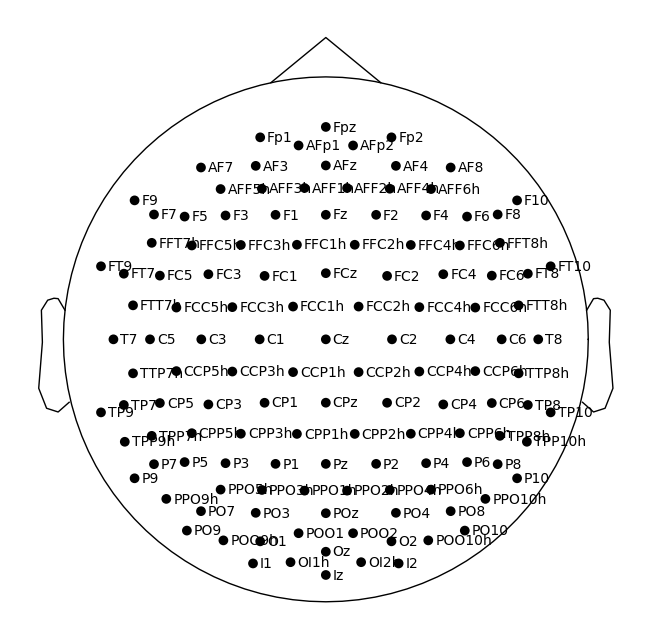

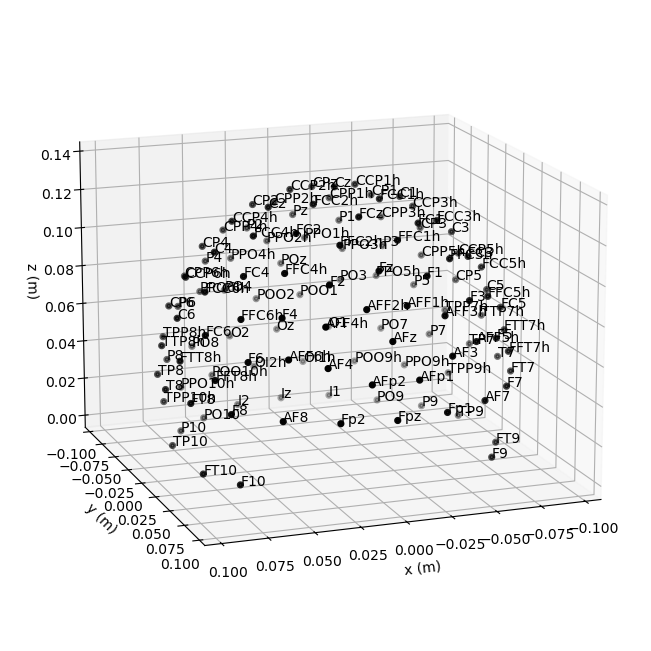

In [14]:
# 2D
montage.plot()
# 3D
fig = montage.plot(kind="3d", show=False)  
fig = fig.gca().view_init(azim=70, elev=15)

#### 使用montage进行定位

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated


/tmp/ipykernel_7260/1900085310.py:1: RuntimeWarning: DigMontage is only a subset of info. There are 12 channel positions not present in the DigMontage. The channels missing from the montage are:

['PO5', 'PO6', 'AFF1', 'AFF2', 'PPO1', 'PPO2', 'AFp3h', 'AFp4h', 'FTT9h', 'FTT10h', 'POO3h', 'POO4h'].

Consider using inst.rename_channels to match the montage nomenclature, or inst.set_channel_types if these are not EEG channels, or use the on_missing parameter if the channel positions are allowed to be unknown in your analyses.
  raw.set_montage(montage,


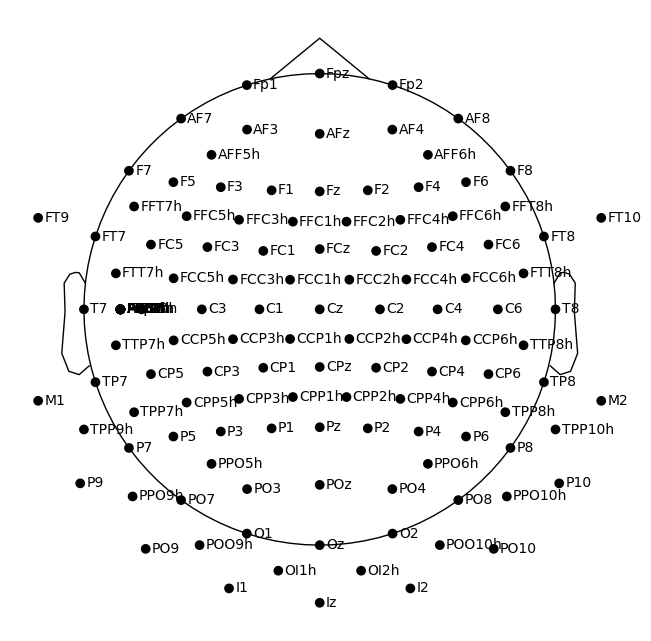

In [15]:
raw.set_montage(montage,
                on_missing='warn',
                match_case=False,
                match_alias=True,)
raw.set_eeg_reference(projection=True)
fig = raw.plot_sensors(show_names=True,
                       sphere="eeglab",)

#### 移除没有定位的电极

In [16]:
montage_channels = list(montage.get_positions()['ch_pos'].keys())
raw_channels = list(raw.get_montage().get_positions()['ch_pos'].keys())
except_raw_ch = []
for ch in raw_channels:
    if ch not in montage_channels :
        except_raw_ch.append(ch)    
except_raw_ch

['M1',
 'M2',
 'PO5',
 'PO6',
 'AFF1',
 'AFF2',
 'PPO1',
 'PPO2',
 'AFp3h',
 'AFp4h',
 'FTT9h',
 'FTT10h',
 'POO3h',
 'POO4h']

In [17]:
raw.drop_channels(except_raw_ch)

<RawEDF | 1.edf, 119 x 1226000 (2452.0 s), ~166 kB, data not loaded>

### 绘图分析
#### 能量谱分析 compute_psd

Effective window size : 4.096 (s)
Plotting amplitude spectral density (dB=True).


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


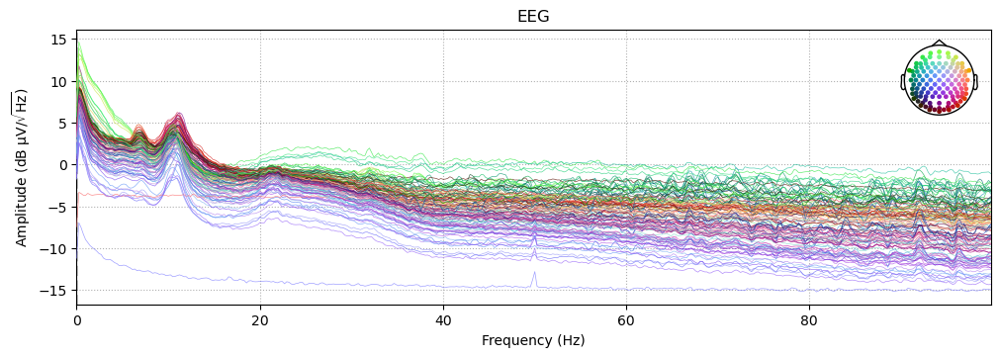

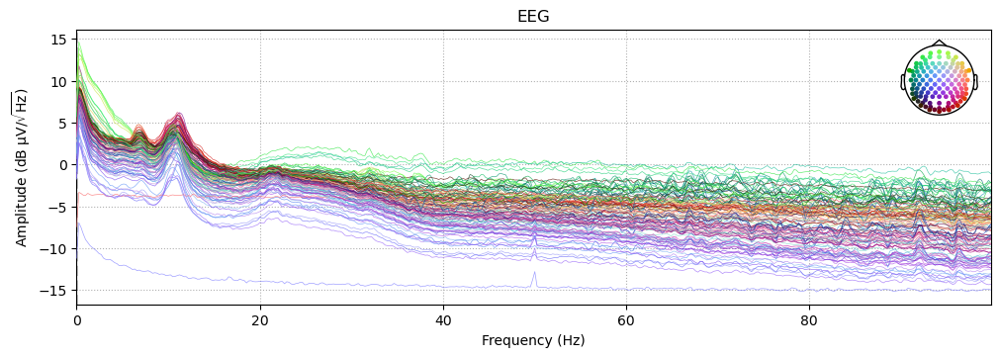

In [18]:
raw.compute_psd(fmax=100).plot(picks="eeg", exclude="bads", amplitude=True)

#### 绘制不同通道的时序图

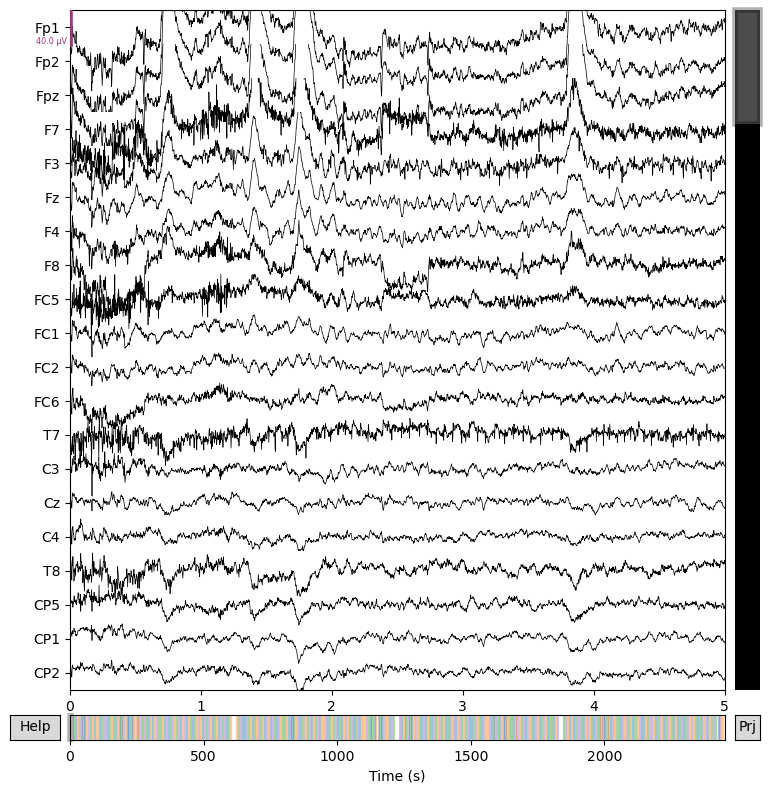

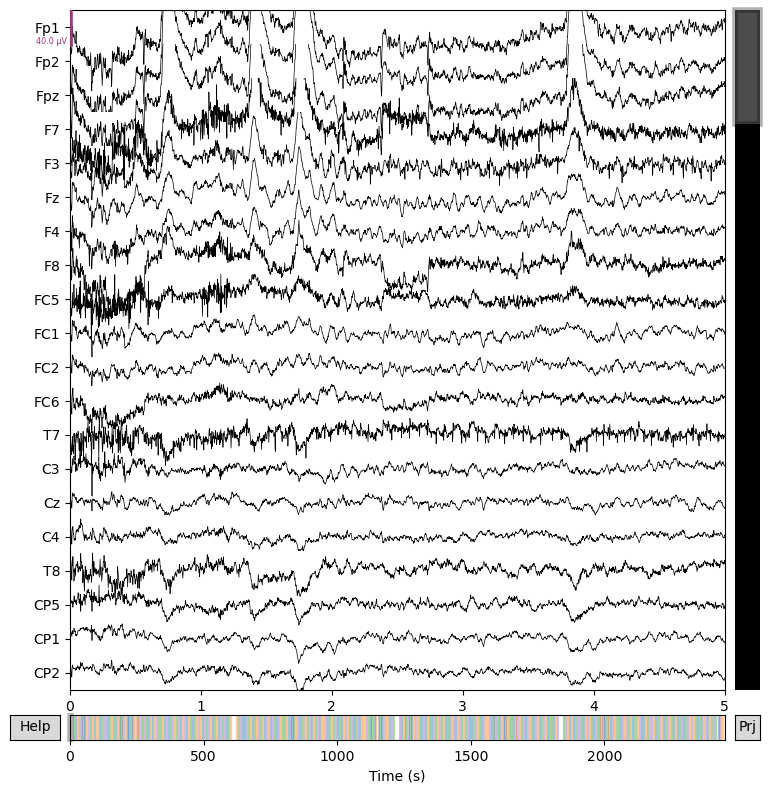

In [19]:
raw.plot(duration=5, n_channels=20)

### 降采样

In [20]:
raw.load_data()
raw.resample(250)

Reading 0 ... 1225999  =      0.000 ...  2451.998 secs...


<RawEDF | 1.edf, 119 x 613000 (2452.0 s), ~556.7 MB, data loaded>

### 滤波
- hamming窗
- 高通滤波：1 Hz（0.3 Hz过渡带宽）
- 低通滤波：50 Hz（10 Hz过渡带宽）
- 阻带衰减：53 dB

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.30 Hz (-6 dB cutoff frequency: 0.85 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Filter length: 2751 samples (11.004 s)



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 114 out of 114 | elapsed:    5.7s finished


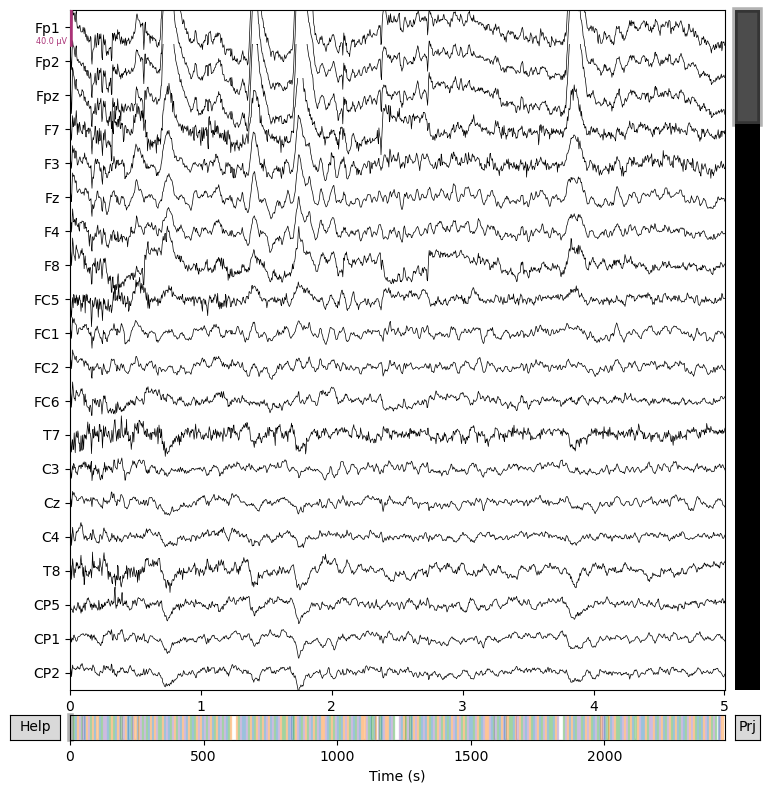

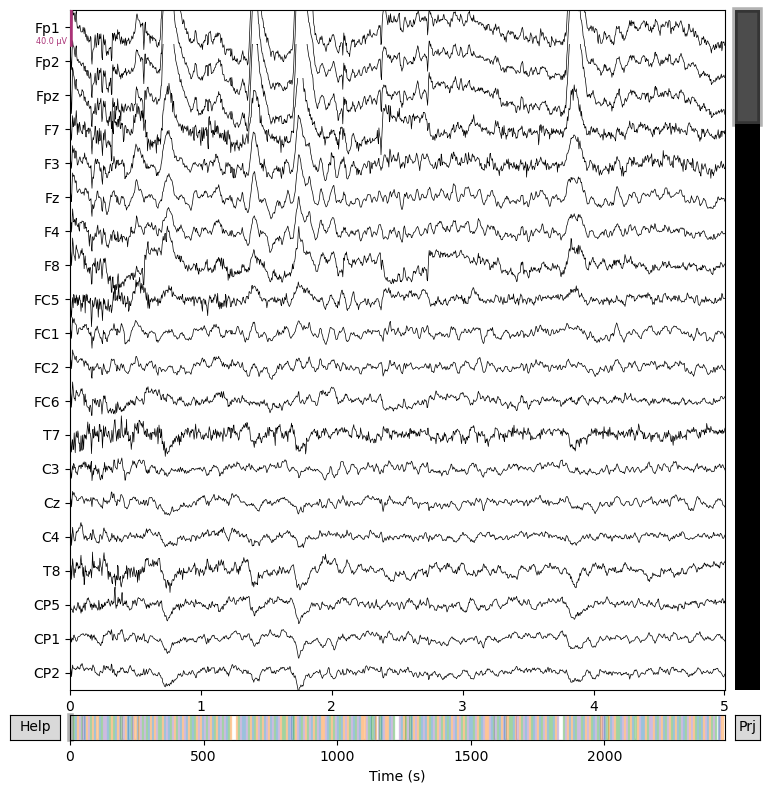

In [22]:
raw.filter(
    l_freq=1.0,
    h_freq=100.0,
    picks=['eeg'],
    l_trans_bandwidth=0.3,
    h_trans_bandwidth=10,
    n_jobs=-1, # 可以设置为'cuda'
    fir_window='hamming'
    ,)
raw.plot(duration=5, n_channels=20)

### 去除伪迹
直接使用ICA去伪迹

Using EOG channels: EOG EOGh, EOG EOGv
EOG channel index for this subject is: [30 31]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG EOGh for blink detection
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 100.25 Hz)
- Filter length: 2500 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 120 significant peaks
Number of EOG events detected: 120
Not setting metadata
120 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
Using data from preloaded Raw for 120 events and 2

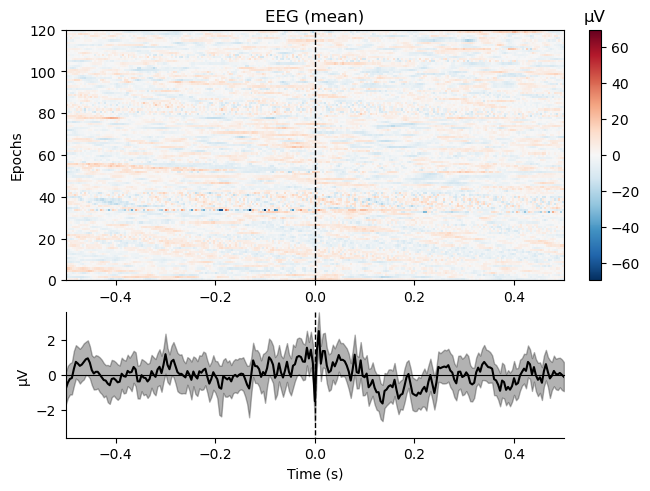

[<Figure size 640x480 with 3 Axes>]

In [23]:
from mne.preprocessing import ICA, corrmap, create_eog_epochs

eog_epochs = create_eog_epochs(raw,
    l_freq=1.0,
    h_freq=100.0,)
# eog_epochs.apply_baseline(baseline=(None, -0.2))
eog_epochs.plot_image(combine="mean")

Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


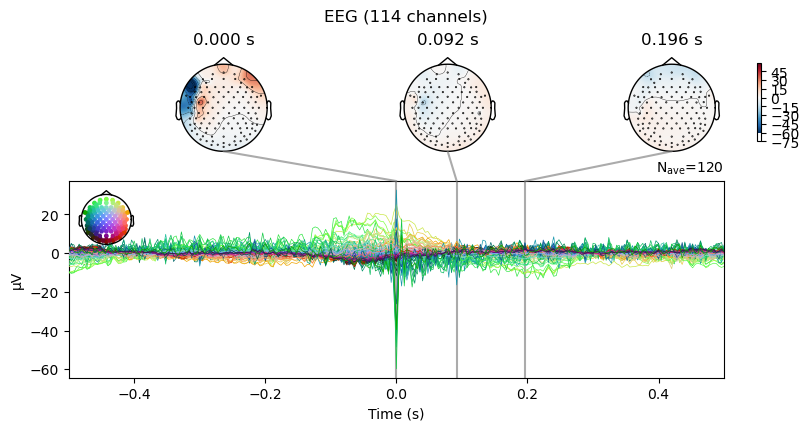

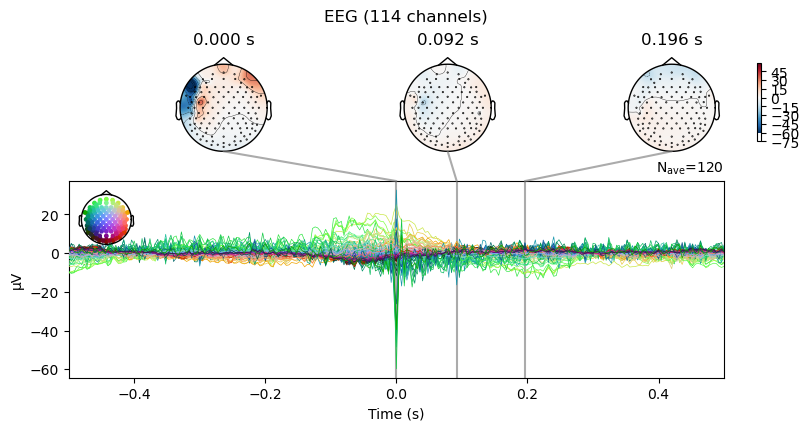

In [24]:
eog_epochs.average().plot_joint()

In [25]:
ica = ICA(n_components=15, max_iter="auto", random_state=97)
ica.fit(raw)
ica

Fitting ICA to data using 114 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 71.9s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,48 iterations on raw data (613000 samples)
ICA components,15
Available PCA components,114
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=17, n_times=613000
    Range : 0 ... 612999 =      0.000 ...  2451.996 secs
Ready.


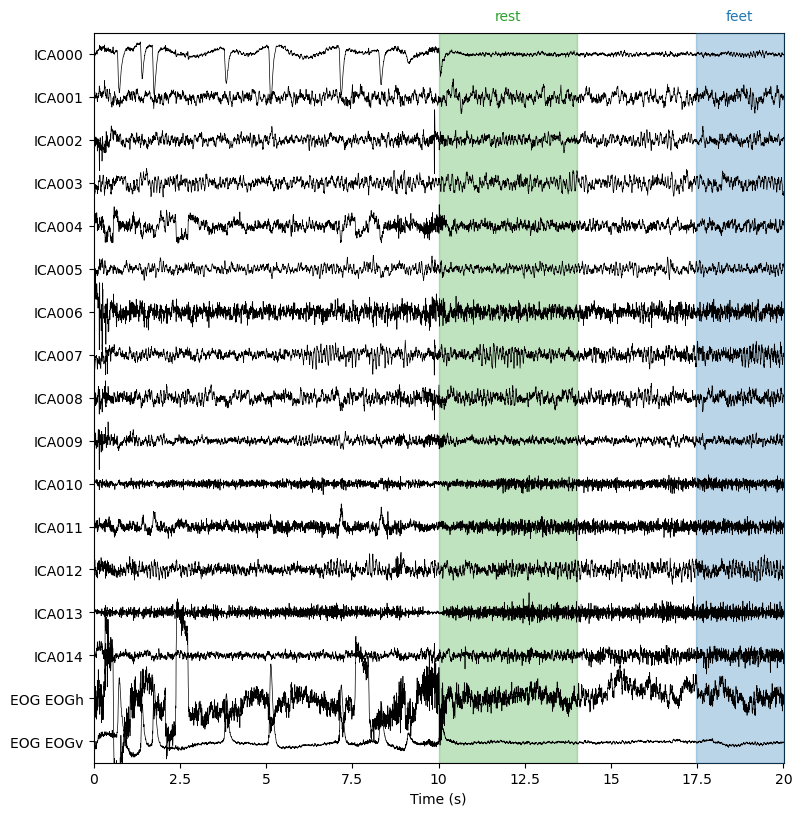

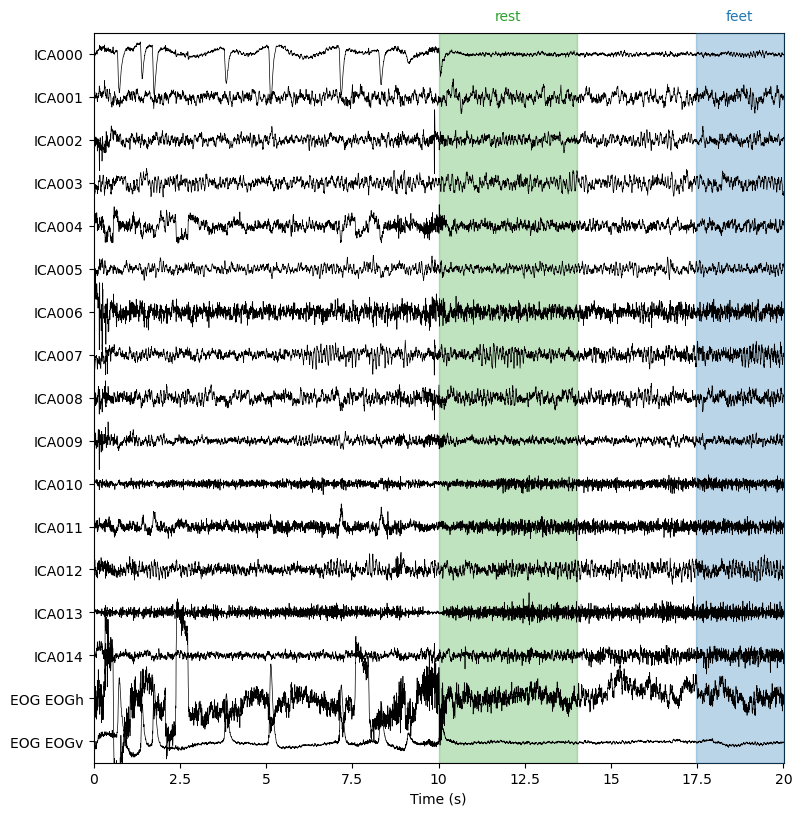

In [28]:
raw.load_data()
ica.plot_sources(raw, show_scrollbars=False)

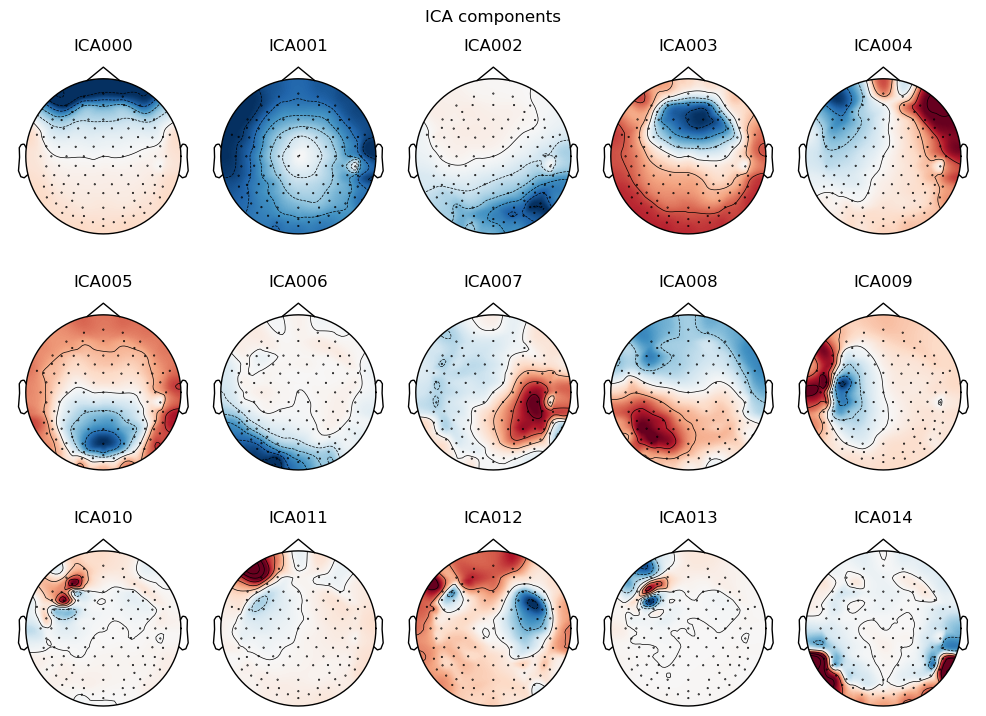

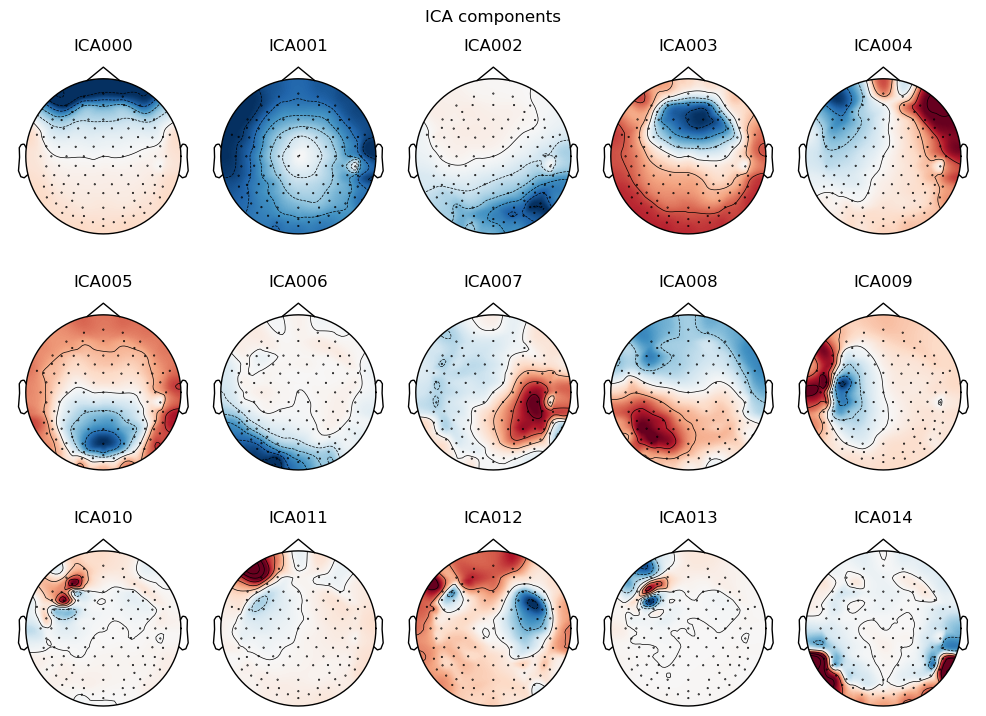

In [29]:
ica.plot_components()

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 114 PCA components


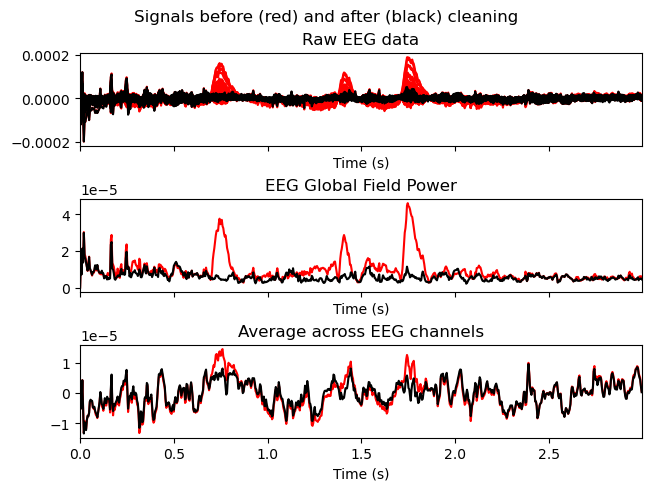

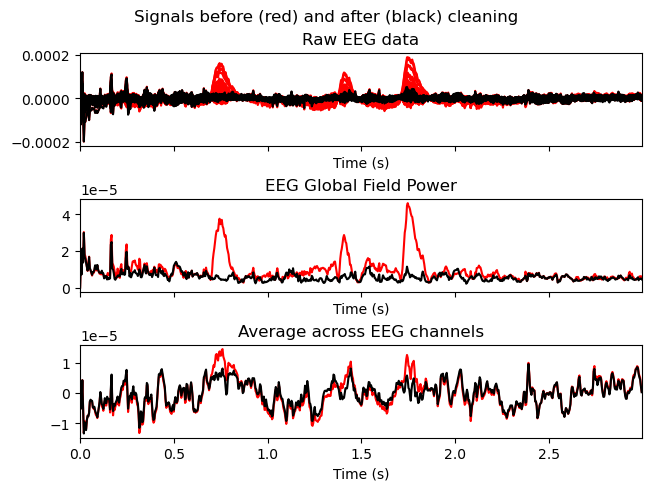

In [30]:
# blinks
ica.plot_overlay(raw, exclude=[0], picks="eeg")

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 114 PCA components


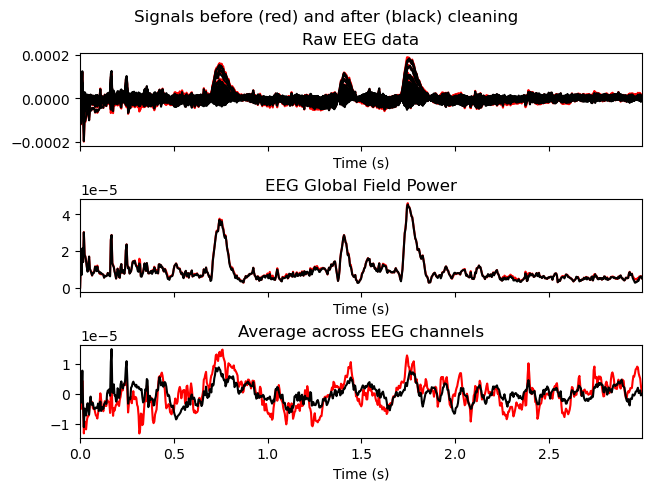

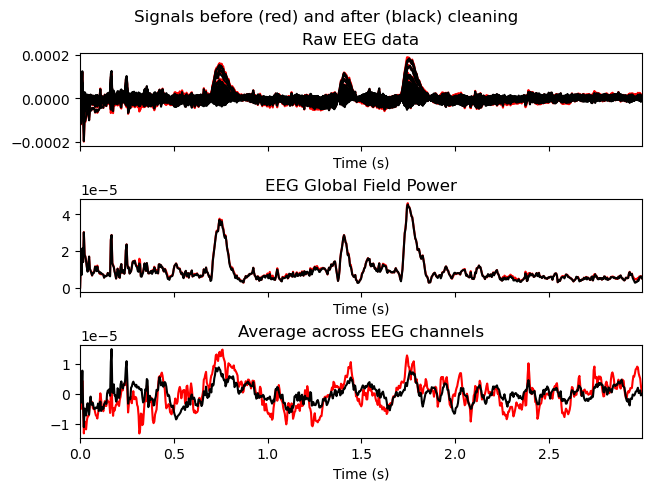

In [31]:
ica.plot_overlay(raw, exclude=[1], picks="eeg")

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1226 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1226 matching events found
No baseline correction applied
0 projection items activated


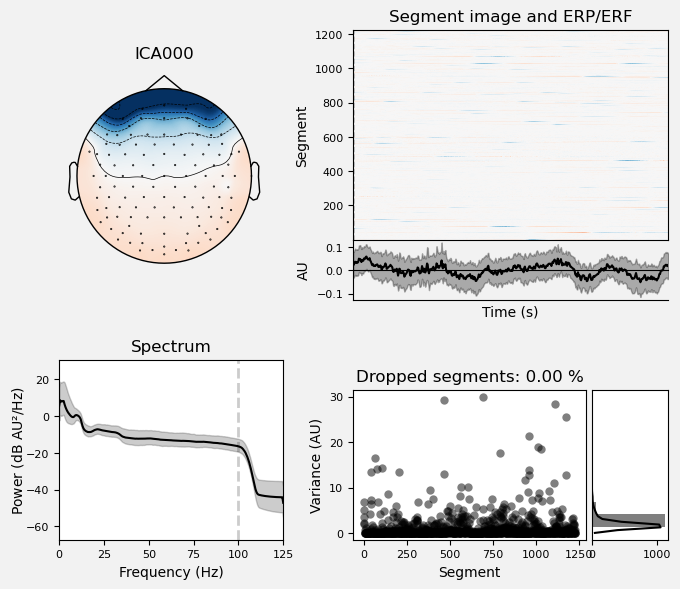

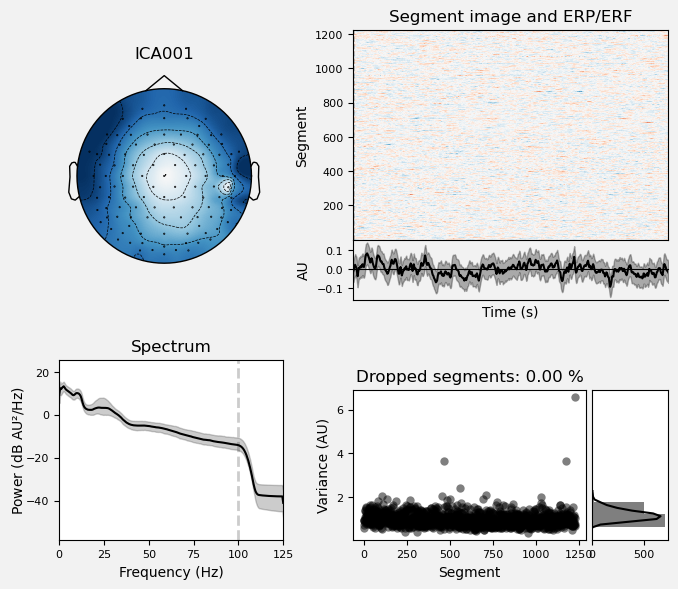

[<Figure size 700x600 with 6 Axes>, <Figure size 700x600 with 6 Axes>]

In [32]:
ica.plot_properties(raw, picks=[0, 1])

#### 查找ICA中的眼动成分

Using EOG channels: EOG EOGh, EOG EOGv
... filtering ICA sources
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 100.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutof

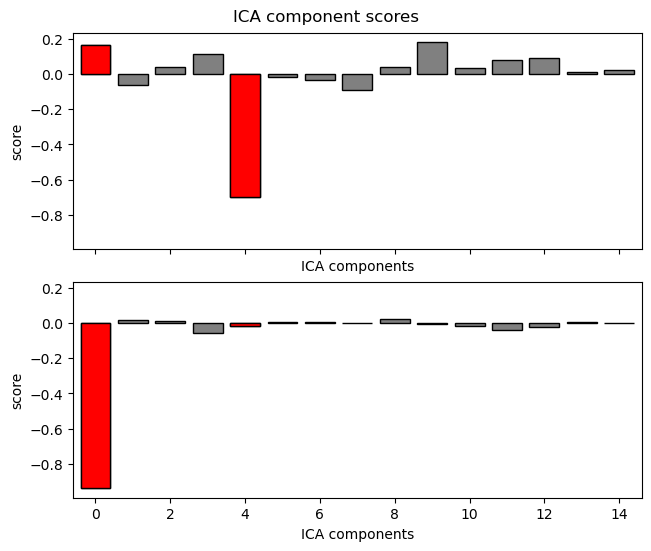

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1226 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1226 matching events found
No baseline correction applied
0 projection items activated


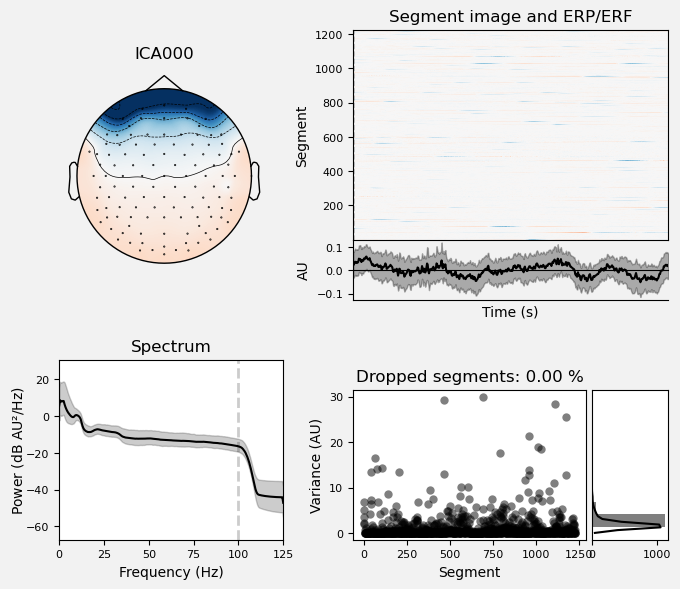

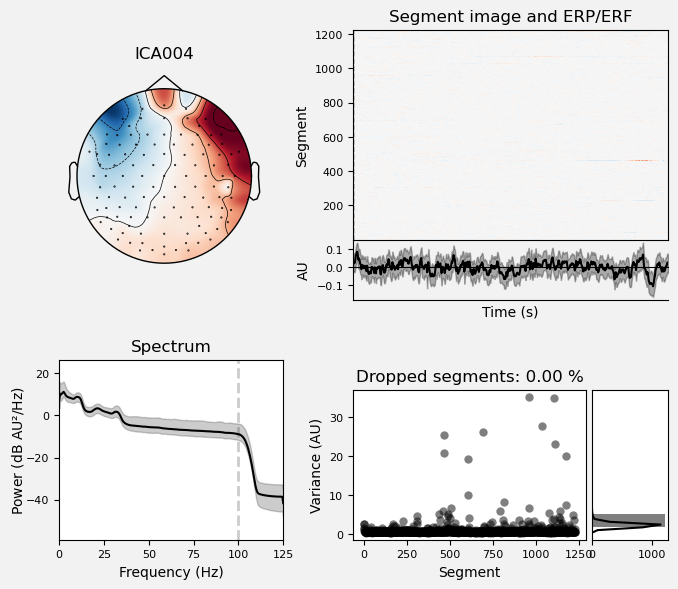

Creating RawArray with float64 data, n_channels=17, n_times=613000
    Range : 0 ... 612999 =      0.000 ...  2451.996 secs
Ready.


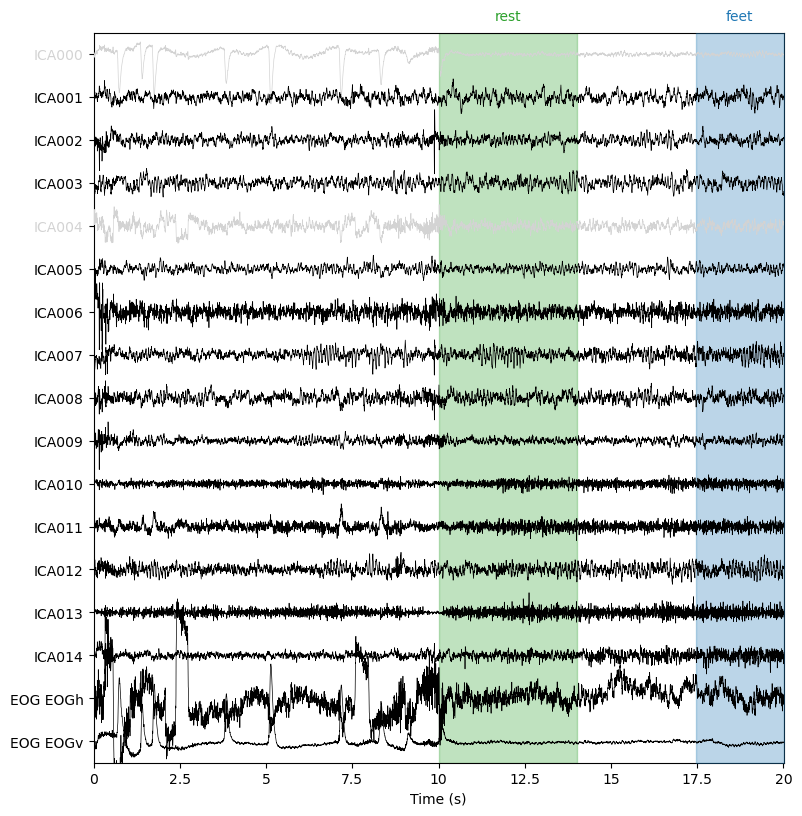

Not setting metadata
120 matching events found
No baseline correction applied
0 projection items activated


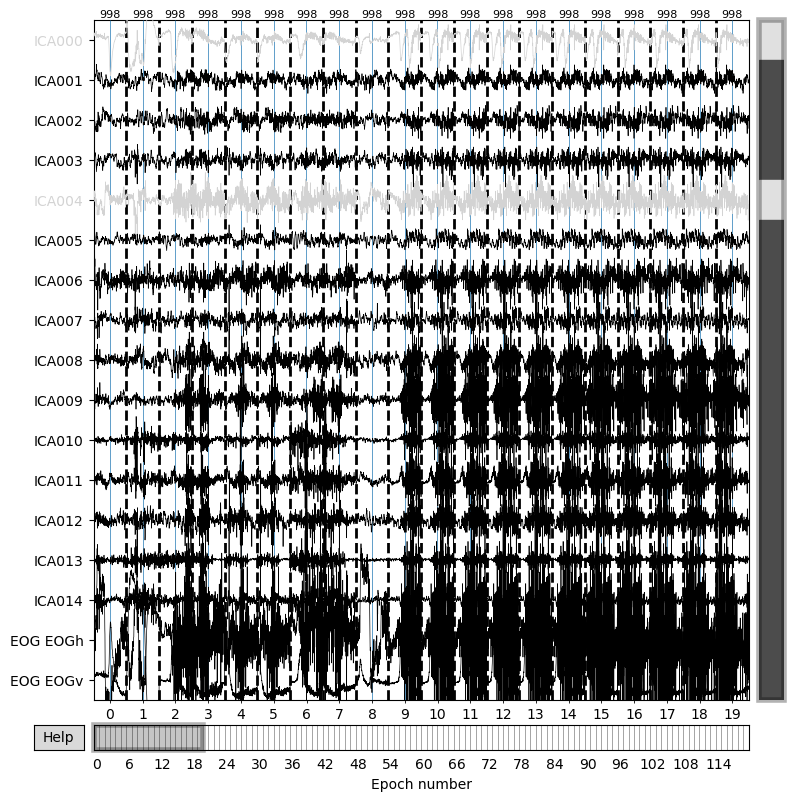

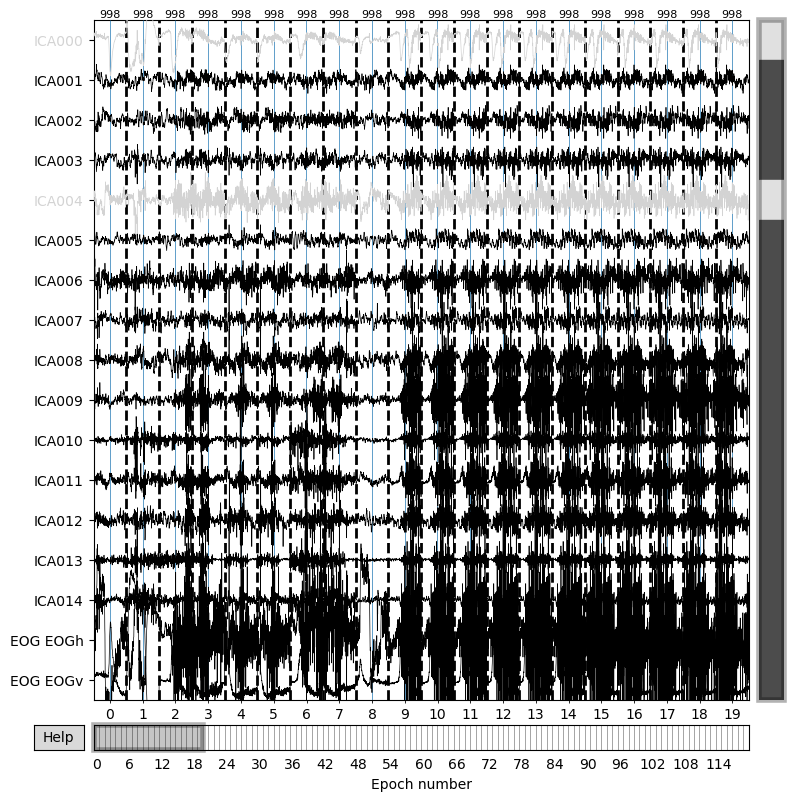

In [33]:
ica.exclude = []

eog_indices, eog_scores = ica.find_bads_eog(raw,
    l_freq=1.0,
    h_freq=100.0,)
ica.exclude = eog_indices


ica.plot_scores(eog_scores)


ica.plot_properties(raw, picks=eog_indices)


ica.plot_sources(raw, show_scrollbars=False)


ica.plot_sources(eog_epochs)

### 重参考
平均参考

/tmp/ipykernel_7260/3754526336.py:1: RuntimeWarning: The locations of multiple reference channels are ignored.
  raw = mne.add_reference_channels(raw, ref_channels='average')


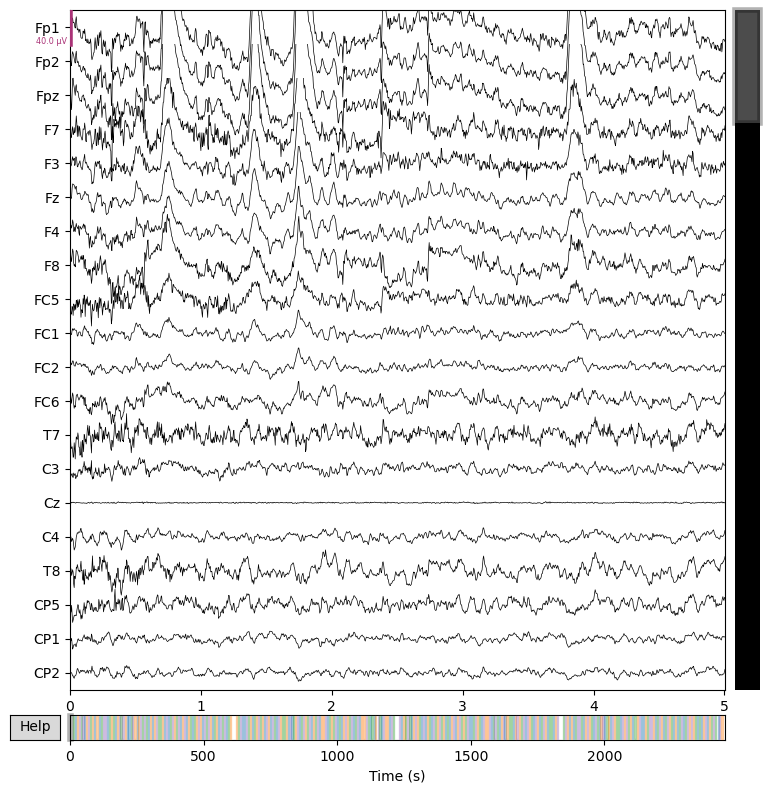

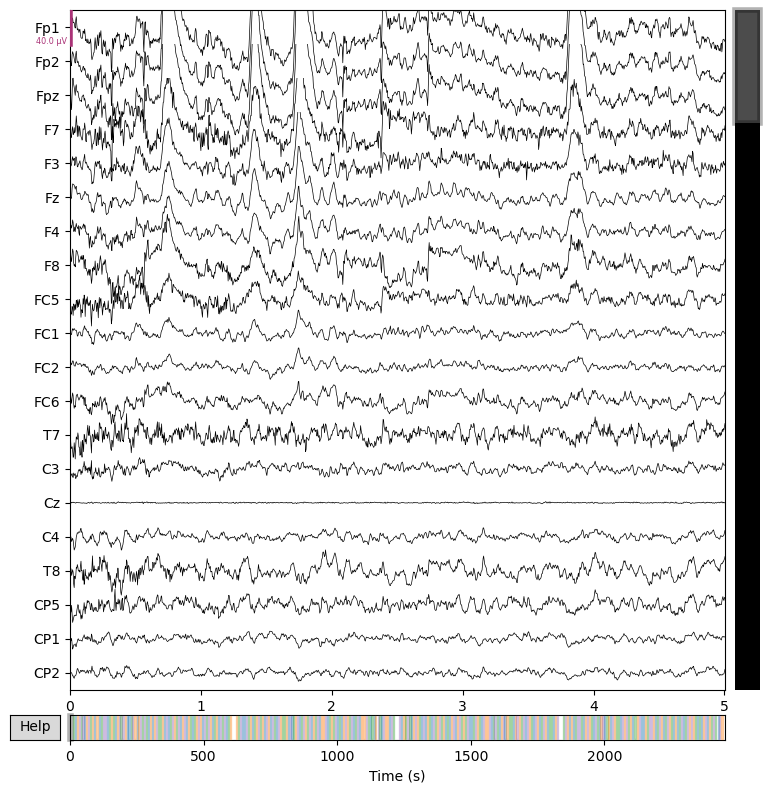

In [34]:
raw = mne.add_reference_channels(raw, ref_channels='average')
raw.plot(duration=5, n_channels=20)

## 处理事件
### 从注释中读取事件

In [35]:
events_from_annot, event_dict = mne.events_from_annotations(raw)
print(event_dict)
print(events_from_annot[:5])

Used Annotations descriptions: ['feet', 'left_hand', 'rest', 'right_hand']
{'feet': 1, 'left_hand': 2, 'rest': 3, 'right_hand': 4}
[[2500    0    3]
 [4363    0    1]
 [6118    0    2]
 [7970    0    4]
 [9866    0    3]]


### 可视化
#### [mne.viz.plot_events](https://mne.tools/stable/generated/mne.viz.plot_events.html#mne.viz.plot_events)

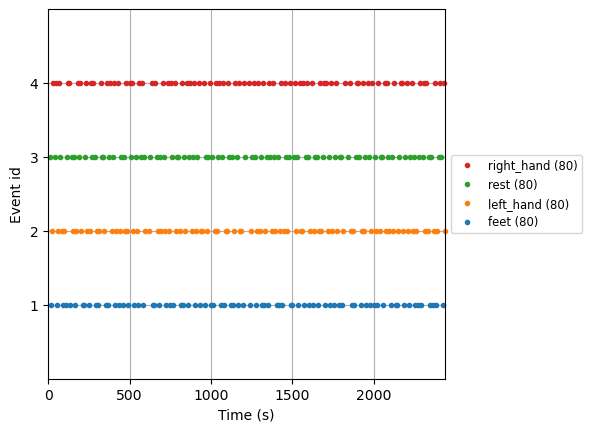

In [36]:
fig = mne.viz.plot_events(
    events_from_annot, sfreq=raw.info["sfreq"], first_samp=raw.first_samp, event_id=event_dict
)

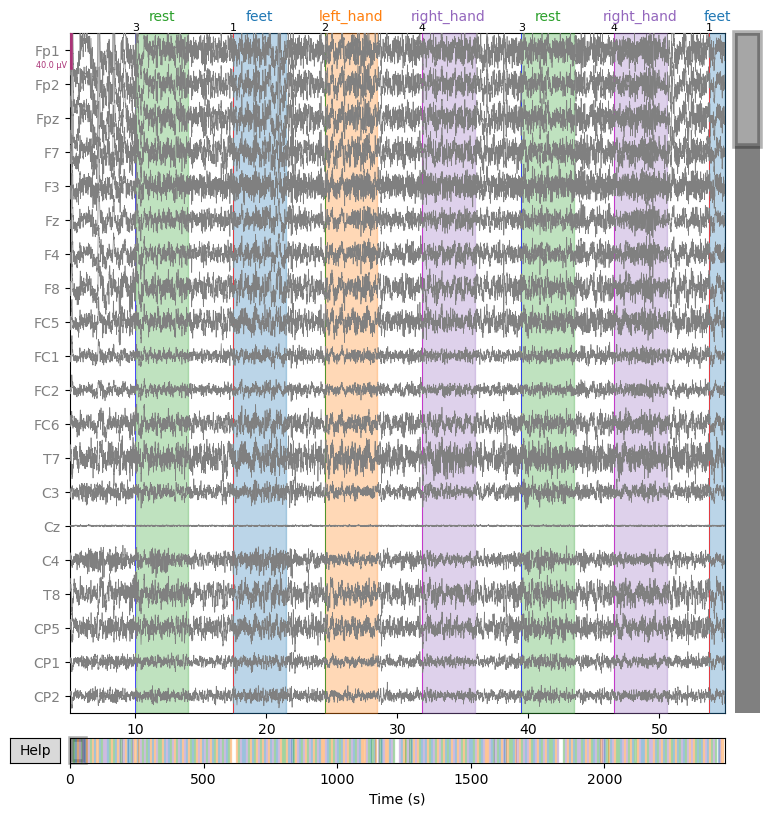

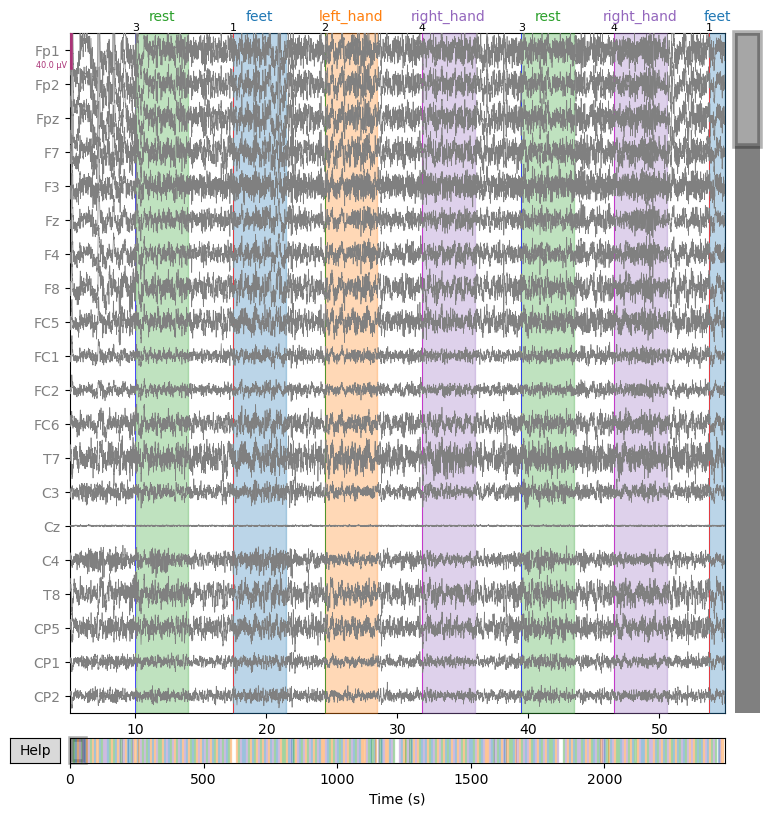

In [37]:
raw.plot(
    events=events_from_annot,
    start=5,
    duration=50,
    color="gray",
    event_color={1: "r", 2: "g", 3: "b", 4: "m"},
)

### 根据事件分段

In [38]:
epochs = mne.Epochs(raw,
                    events_from_annot,
                    tmin=-0.3, tmax=4,
)
epochs.load_data()

Not setting metadata
320 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 320 events and 1076 original time points ...
0 bad epochs dropped


<Epochs | 320 events (all good), -0.3 – 4 s (baseline -0.3 – 0 s), ~315.4 MB, data loaded,
 '1': 80
 '2': 80
 '3': 80
 '4': 80>

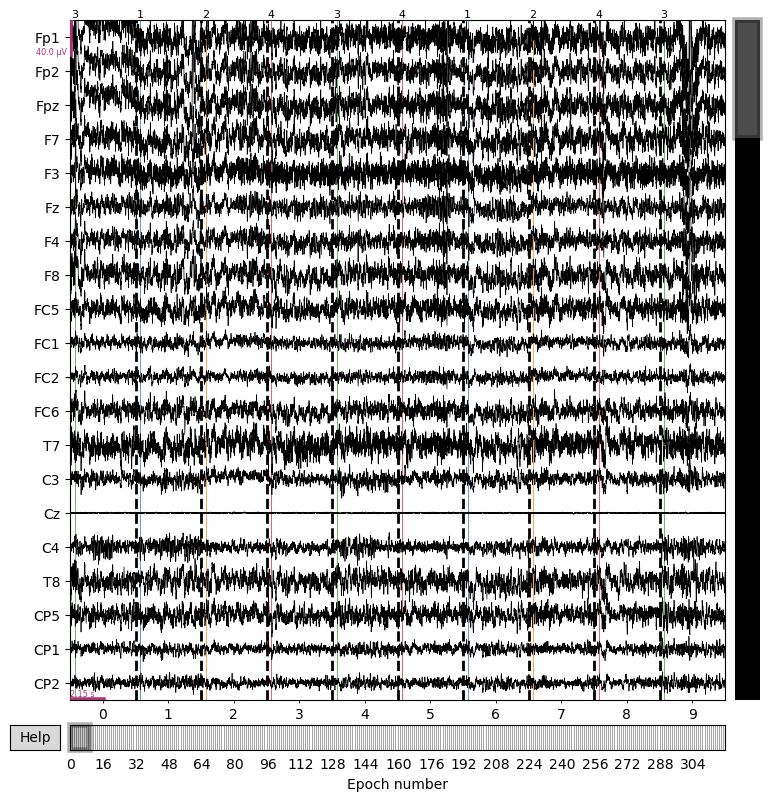

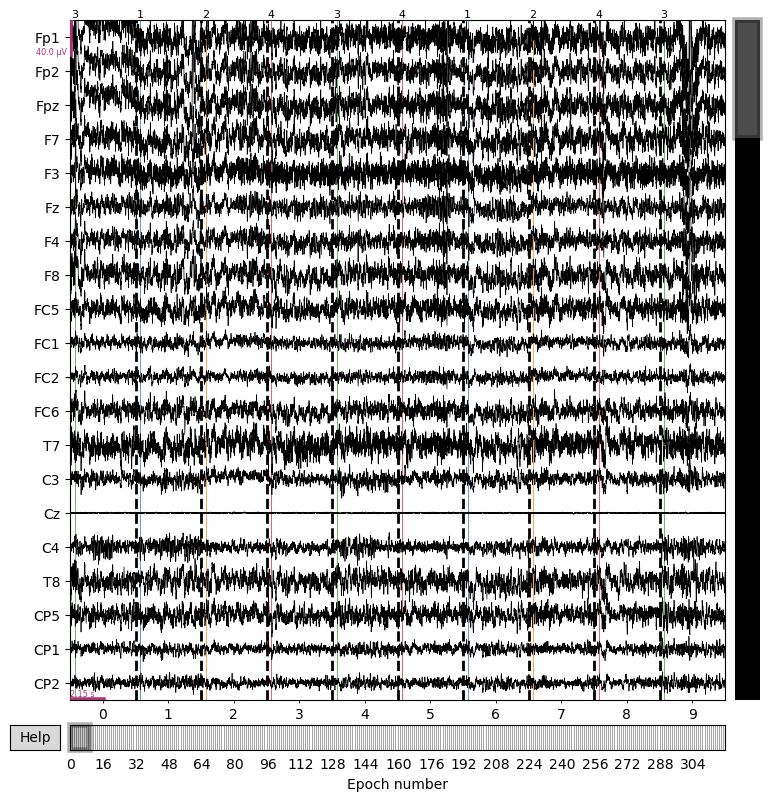

In [39]:
epochs.plot(n_epochs=10, events=True)

### ERP

In [40]:
# {'feet': 1, 'left_hand': 2, 'rest': 3, 'right_hand': 4}
feet = epochs["1"].average()
left_hand = epochs["2"].average()
rest = epochs["3"].average()
right_hand = epochs["4"].average()

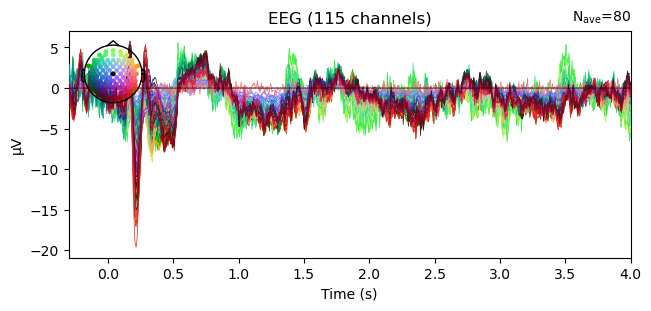

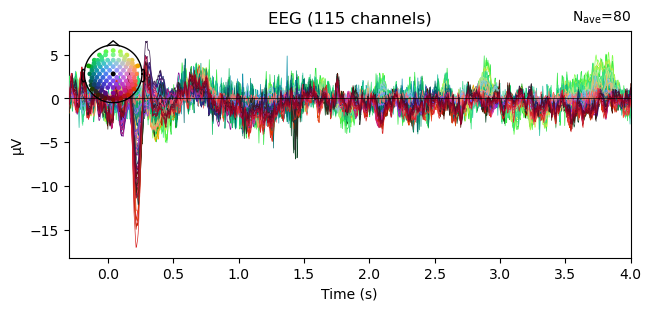

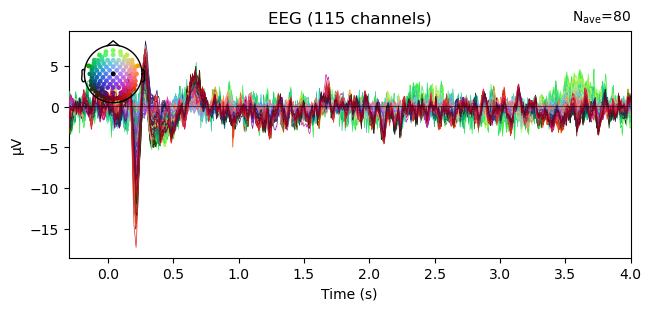

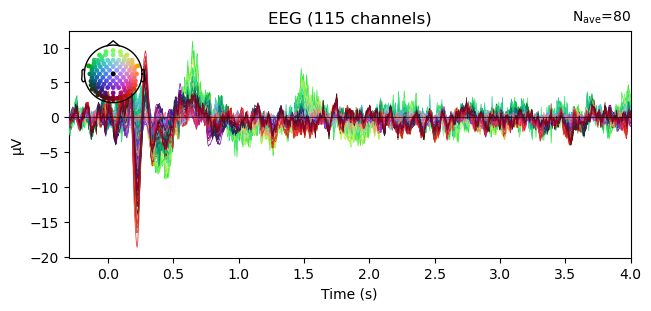

In [41]:
fig1 = feet.plot(spatial_colors=True)
fig2 = left_hand.plot(spatial_colors=True)
fig3 = rest.plot(spatial_colors=True)
fig4 = right_hand.plot(spatial_colors=True)

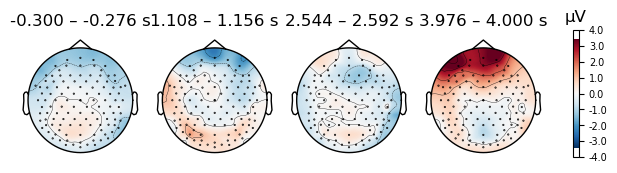

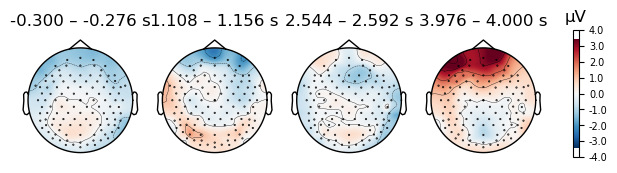

In [42]:
right_hand.plot_topomap(times='auto' , average=0.05)

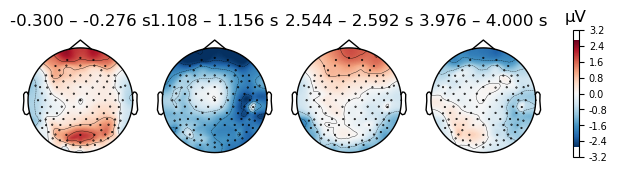

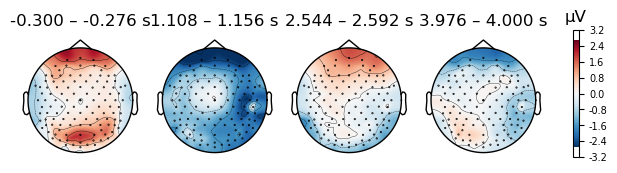

In [43]:
left_hand.plot_topomap(times='auto' , average=0.05)

# 使用Freesurfer构建前向头模型
- FreeSurfer 是一个用于 MRI 数据的开源分析工具箱。
- FreeSurfer 提供用于可视化 MRI 数据的图形界面、用于创建感兴趣区域 (ROI) 标签的几种解剖分区、模板大脑（例如fsaverage）以及几种命令行工具（用于查找组织边界或变形大脑以在受试者之间对齐类似的解剖区域）。
## 重建大脑皮层
- FreeSurfer 执行半球分离，因此大多数生成的文件都有单独的左半球和右半球版本，由前缀 lh或表示rh。这种半球分离由 MNE-Python 保留（例如， mne.SourceEstimate对象分别存储两个半球的空间位置

In [44]:
import numpy as np

import mne
from mne.datasets import eegbci, fetch_fsaverage

# Download fsaverage files
fs_dir = fetch_fsaverage(verbose=True)
subjects_dir = fs_dir.parent

subject = "fsaverage"

src =  mne.read_source_spaces(fs_dir / "bem" / "fsaverage-ico-5-src.fif")

0 files missing from root.txt in /root/mne_data/MNE-fsaverage-data
0 files missing from bem.txt in /root/mne_data/MNE-fsaverage-data/fsaverage
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    2 source spaces read


In [45]:
import ipywidgets as widgets

from IPython.display import display
from IPython.display import Image

from datetime import datetime
import matplotlib.pyplot as plt

def show_PyVista(fig):
    screenshot = fig.plotter.screenshot()
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(screenshot, origin='upper')
    ax.set_axis_off()  # Disable axis labels and ticks
    fig.tight_layout()
    fig.savefig('fig.png', dpi=150)

## 坐标系对齐
对于MEG/EEG源成像，需要使用两个变换矩阵将三个坐标系对齐
- MEG/EEG：MEG/EEG传感器物理位置的坐标框架
- MRI：MRI图像的坐标框架，以及从MRI图像得出的头皮、头骨和大脑表面
- 头部：数字化传感器位置和头皮标志（基准点）的坐标框架

In [46]:
trans = mne.read_trans(fs_dir / "bem" /"fsaverage-trans.fif")  # MNE has a built-in fsaverage transformation

QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-root'


Using outer_skin.surf for head surface.
Channel types::	eeg: 115
Projecting sensors to the head surface


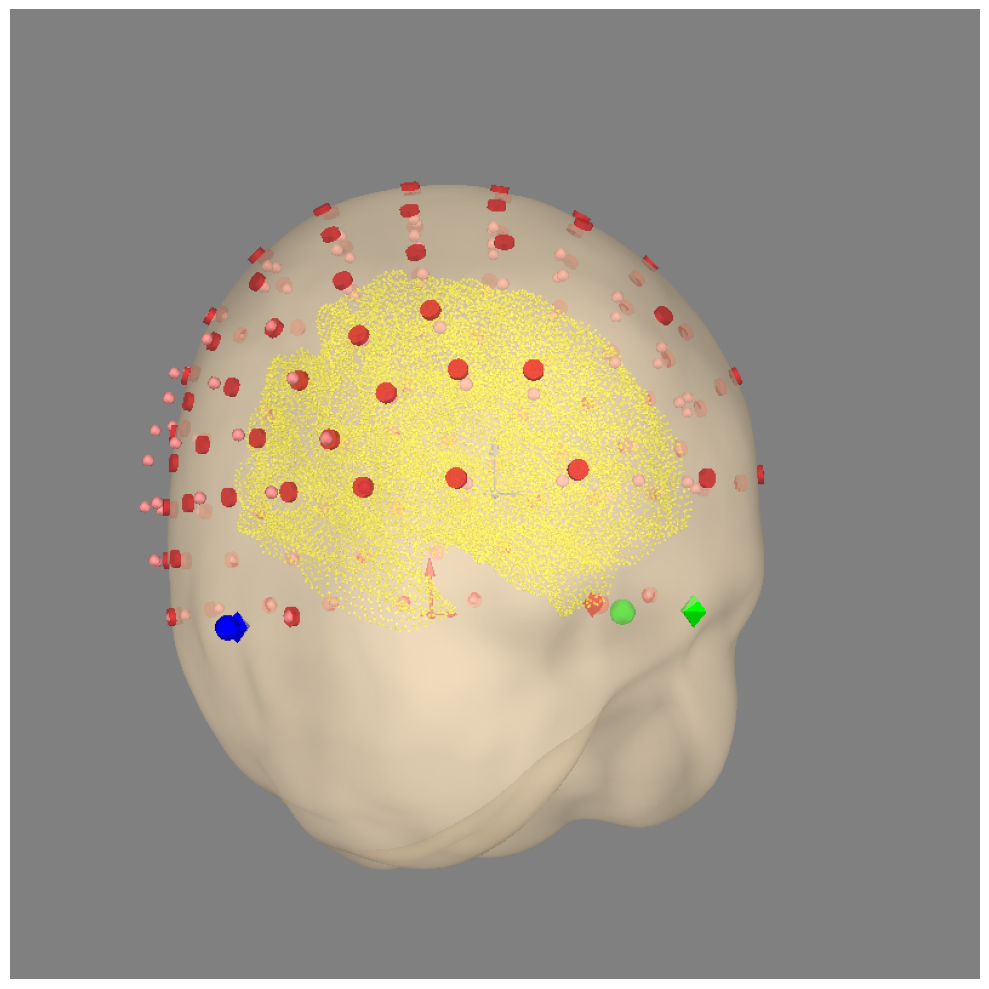

In [47]:
import nibabel as nib
from scipy import linalg

t1w = nib.load(fs_dir / "mri" / "T1.mgz")
t1w = nib.Nifti1Image(t1w.dataobj, t1w.affine)
t1w.header["xyzt_units"] = np.array(10, dtype="uint8")
t1_mgh = nib.MGHImage(t1w.dataobj, t1w.affine)

fig = mne.viz.plot_alignment(
    raw.info,
    src=src,
    eeg=["original", "projected"],
    trans=trans,
    show_axes=True,
    mri_fiducials=True,
    dig="fiducials",
    # sensor_colors={'eeg':'blue'}
)
mne.viz.set_3d_view(fig, 45, 90, distance=0.6, focalpoint=(0.0, 0.0, 0.0))
show_PyVista(fig)

## 构建头模型
### 计算正向算子
所需部分：
1. `-trans.fif`包含核心注册信息的文件
2. 源空间
3. BEM表面
### 计算并可视化BEM表面

Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/inner_skull.surf
Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/outer_skull.surf
Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/outer_skin.surf


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


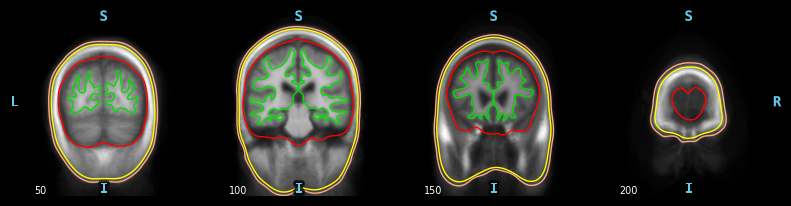

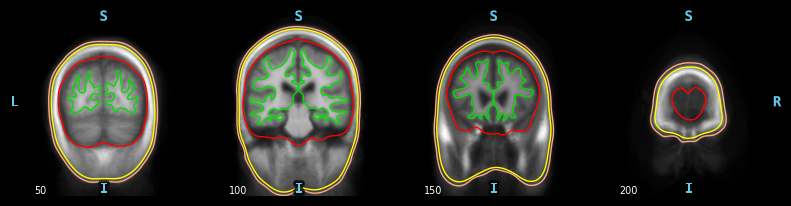

In [48]:
plot_bem_kwargs = dict(
    subject=subject,
    subjects_dir=subjects_dir,
    brain_surfaces="white",
    orientation="coronal",
    slices=[50, 100, 150, 200],
)

mne.viz.plot_bem(**plot_bem_kwargs)

### 计算源空间
#### 分类
- 当候选对象被限制在表面时，**基于表面的源空间**——mne.setup_source_space()
- 当候选点是离散的、任意位置的、由表面界定的源点时，**体积或离散源空间**——mne.setup_volume_source_space()

In [49]:
src = mne.setup_source_space(
    subject, spacing="oct6", add_dist="patch", subjects_dir=subjects_dir
)
print(src)

Setting up the source space with the following parameters:

SUBJECTS_DIR = /root/mne_data/MNE-fsaverage-data
Subject      = fsaverage
Surface      = white
Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /root/mne_data/MNE-fsaverage-data/fsaverage/surf/lh.white...
Mapping lh fsaverage -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /root/mne_data/MNE-fsaverage-data/fsaverage/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/163842 selected to source space (oct = 6)

Loading /root/mne_data/MNE-fsaverage-data/fsaverage/surf/rh.white...
Mapping rh fsaverage -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /root/mne_data/MNE-fsaverage-data/fsaverage/surf/rh.sphere...
Setting up the triangulation for the decimated surface...
loaded rh.white 4098/163842 selected to source space (oct = 6)

Calculating patch informa

Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/inner_skull.surf
Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/outer_skull.surf
Using surface: /root/mne_data/MNE-fsaverage-data/fsaverage/bem/outer_skin.surf


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


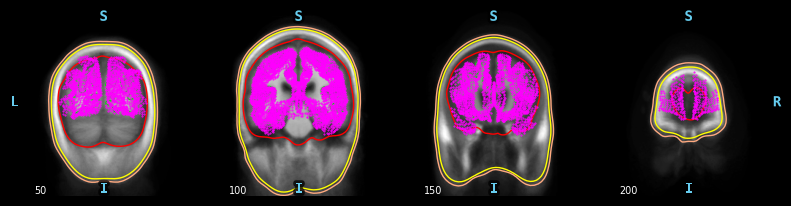

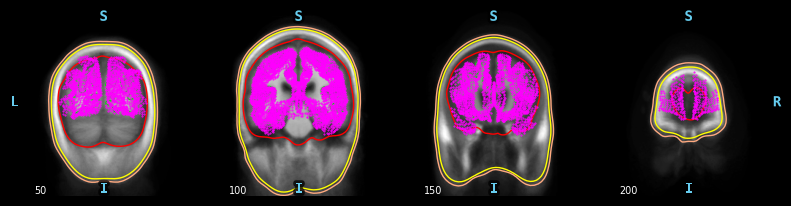

In [50]:
mne.viz.plot_bem(src=src, **plot_bem_kwargs)

#### 计算基于体积的源空间
- 该源空间由以 (0.0, -10.0, 10.0) 毫米为中心的半径为 90 毫米的球体内的候选偶极子网格定义。
- 显然，这里的球体并不完美。它并不局限于大脑，而且可能会遗漏皮层的某些部分。

Sphere                : origin at (0.0 -10.0 10.0) mm
              radius  : 90.0 mm
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /root/mne_data/MNE-fsaverage-data/fsaverage/mri/T1.mgz

Reading /root/mne_data/MNE-fsaverage-data/fsaverage/mri/T1.mgz...

Setting up the sphere...
Surface CM = (   0.0  -10.0   10.0) mm
Surface fits inside a sphere with radius   90.0 mm
Surface extent:
    x =  -90.0 ...   90.0 mm
    y = -100.0 ...   80.0 mm
    z =  -80.0 ...  100.0 mm
Grid extent:
    x =  -95.0 ...   95.0 mm
    y = -100.0 ...   85.0 mm
    z =  -85.0 ...  100.0 mm
56316 sources before omitting any.
24355 sources after omitting infeasible sources not within 0.0 - 90.0 mm.
20377 sources remaining after excluding the sources outside the surface and less than    5.0 mm inside.
Adjusting the neighborhood info.
Source space : MRI voxel -> MRI (surface RAS)
    0.005000 0.000000 0.000000     -95.00 mm
    0.000000 0.005000 0.000000    -100.00 mm
    0

/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


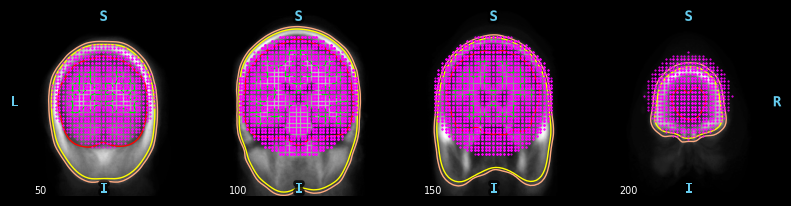

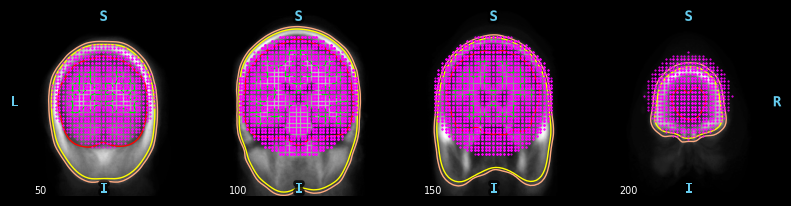

In [51]:
sphere = (0.0, -0.01, 0.01, 0.09)
vol_src = mne.setup_volume_source_space(
    subject,
    subjects_dir=subjects_dir,
    sphere=sphere,
    sphere_units="m",
    add_interpolator=False,
)
print(vol_src)

mne.viz.plot_bem(src=vol_src, **plot_bem_kwargs)

#### 要计算由大脑内部候选偶极子网格定义的基于体积的源空间（需要BEM表面）

Boundary surface file : /root/mne_data/MNE-fsaverage-data/fsaverage/bem/inner_skull.surf
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /root/mne_data/MNE-fsaverage-data/fsaverage/mri/T1.mgz

Reading /root/mne_data/MNE-fsaverage-data/fsaverage/mri/T1.mgz...

Loaded bounding surface from /root/mne_data/MNE-fsaverage-data/fsaverage/bem/inner_skull.surf (10242 nodes)
Surface CM = (  -0.5  -21.1    6.2) mm
Surface fits inside a sphere with radius   98.3 mm
Surface extent:
    x =  -75.3 ...   76.3 mm
    y = -113.4 ...   75.0 mm
    z =  -72.4 ...   88.2 mm
Grid extent:
    x =  -80.0 ...   80.0 mm
    y = -115.0 ...   75.0 mm
    z =  -75.0 ...   90.0 mm
43758 sources before omitting any.
29867 sources after omitting infeasible sources not within 0.0 - 98.3 mm.
Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
Checking surface interior status for 29867 points...
   

/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


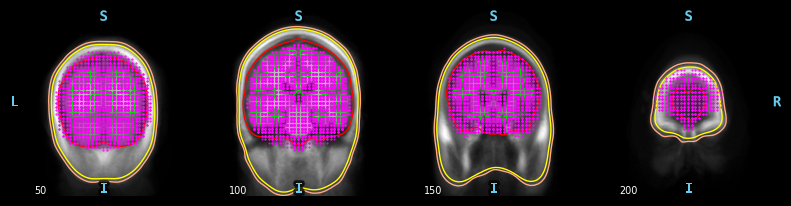

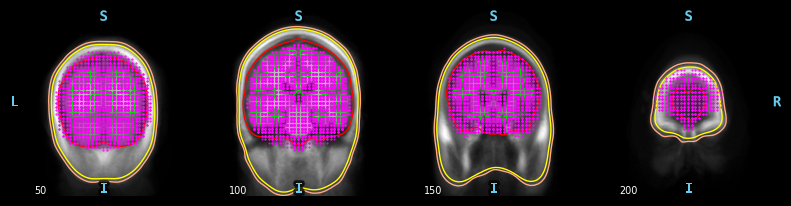

In [52]:
surface = subjects_dir / subject / "bem" / "inner_skull.surf"
vol_src = mne.setup_volume_source_space(
    subject, subjects_dir=subjects_dir, surface=surface, add_interpolator=True
)
print(vol_src)

mne.viz.plot_bem(src=vol_src, **plot_bem_kwargs)

> 某些源可能看起来位于 BEM 内颅骨轮廓之外。这是因为它们slices在此处被抽取以进行绘制。图中的每个切片实际上代表多个 MRI 切片，但仅显示单个（给定切片范围的中点）切片的 MRI 体素和 BEM 边界，而绘制在该中点切片上的源空间点由该切片（在显示的所有切片中）最接近的所有点组成。

#### 以 3D 形式查看所有源。

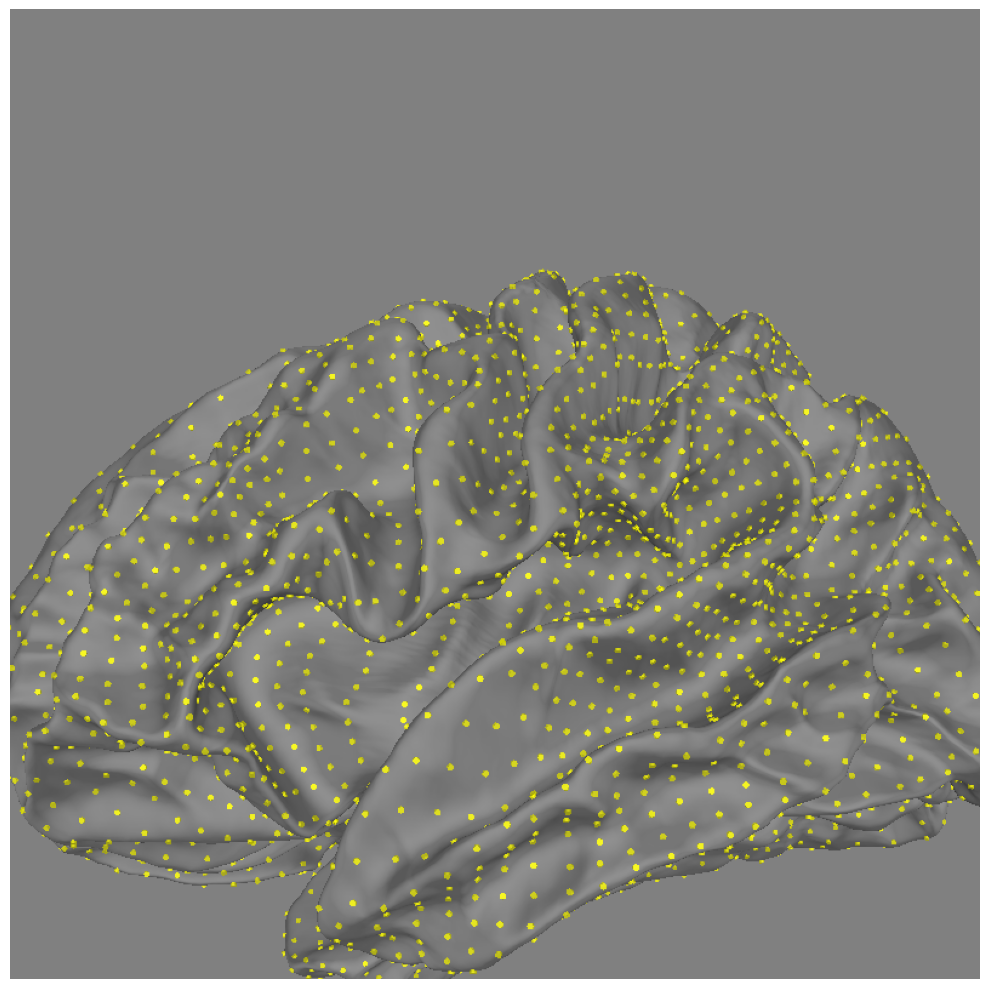

In [53]:
fig = mne.viz.plot_alignment(
    subject=subject,
    subjects_dir=subjects_dir,
    surfaces="white",
    coord_frame="mri",
    src=src,
)
mne.viz.set_3d_view(
    fig,
    azimuth=173.78,
    elevation=101.75,
    distance=0.30,
    focalpoint=(-0.03, -0.01, 0.03),
)
show_PyVista(fig)

### 计算正向解
#### 创建BEM模型
- BEM conductivity解需要一个 BEM 模型，该模型描述头部的几何形状和不同组织的电导率。

In [54]:
bem = mne.read_bem_solution(subjects_dir / subject / "bem" /'fsaverage-5120-5120-5120-bem-sol.fif')

Loading surfaces...

Loading the solution matrix...

Three-layer model surfaces loaded.
Loaded linear collocation BEM solution from /root/mne_data/MNE-fsaverage-data/fsaverage/bem/fsaverage-5120-5120-5120-bem-sol.fif


## 计算噪声协方差矩阵

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 115 -> 114
Estimating covariance using SHRUNK
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-validation to select the best estimator.
Number of samples used : 24320
log-likelihood on unseen data (descending order):
   shrunk: -223.449
   empirical: -223.496
selecting best estimator: shrunk
[done]
Computing rank from covariance with rank=None
    Using tolerance 7.1e-13 (2.2e-16 eps * 115 dim * 28  max singular value)
    Estimated rank (eeg): 114
    EEG: rank 114 computed from 115 data channels with 0 projectors


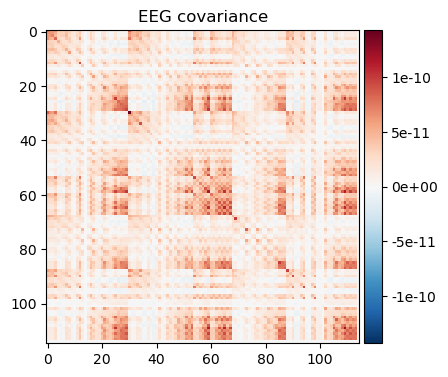

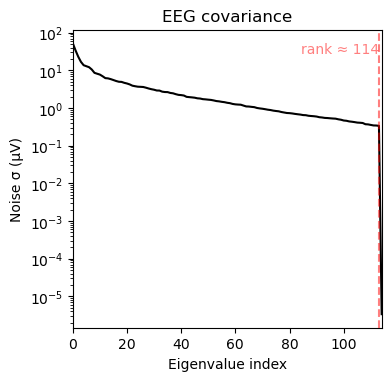

In [55]:
raw.set_eeg_reference(projection=True)
noise_cov = mne.compute_covariance(
    epochs, tmax=0.0, method=["shrunk", "empirical"], rank=None, verbose=True,n_jobs = -1
)

fig_cov, fig_spectra = mne.viz.plot_cov(noise_cov, raw.info)

#### 计算前向算子，通常称为增益或引线场矩阵

In [56]:
raw.set_eeg_reference(projection=True)
raw.drop_channels('average')
fwd = mne.make_forward_solution(
    raw.info, trans=trans, src=src, bem=bem, eeg=True, mindist=5.0, n_jobs=-1
)
print(fwd)

EEG channel type selected for re-referencing


/tmp/ipykernel_7260/1403431507.py:1: RuntimeWarning: An average reference projection was already added. The data has been left untouched.
  raw.set_eeg_reference(projection=True)


Source space          : <SourceSpaces: [<surface (lh), n_vertices=163842, n_used=4098>, <surface (rh), n_vertices=163842, n_used=4098>] MRI (surface RAS) coords, subject 'fsaverage', ~31.3 MB>
MRI -> head transform : instance of Transform
Measurement data      : instance of Info
Conductor model   : instance of ConductorModel
Accurate field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 8196 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    0.999994 0.003552 0.000202      -1.76 mm
    -0.003558 0.998389 0.056626      31.09 mm
    -0.000001 -0.056626 0.998395      39.60 mm
    0.000000 0.000000 0.000000       1.00

Read 114 EEG channels from info
Head coordinate coil definitions created.
Source spaces are now in head coordinates.

Employing the head->MRI coordinate transform with the BEM model.
BEM model instance of ConductorModel is now set up

Source spaces are in head coordinates.
Checking that

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    6.8s


    Found    0/3099 points outside using solid angles
    Total 4098/4098 points inside the surface
Interior check completed in 7393.2 ms
Checking surface interior status for 4098 points...
    Found  906/4098 points inside  an interior sphere of radius   47.7 mm
    Found    0/4098 points outside an exterior sphere of radius   98.3 mm
    Found    0/3192 points outside using surface Qhull


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


    Found    0/3192 points outside using solid angles
    Total 4098/4098 points inside the surface
Interior check completed in 796.6 ms



[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.8s finished


Setting up for EEG...
Computing EEG at 8196 source locations (free orientations)...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    6.8s finished



Finished.
<Forward | MEG channels: 0 | EEG channels: 114 | Source space: Surface with 8196 vertices | Source orientation: Free>


> 正向计算可以移除太靠近（或超出）头骨内表面的顶点。
>
> 对于许多函数（例如 ），传递 或mne.compute_source_morph()很重要，以便充分考虑这种移除。fwd['src']inv['src']

In [57]:
print(f"Before: {src}")
print(f'After:  {fwd["src"]}')

Before: <SourceSpaces: [<surface (lh), n_vertices=163842, n_used=4098>, <surface (rh), n_vertices=163842, n_used=4098>] MRI (surface RAS) coords, subject 'fsaverage', ~31.3 MB>
After:  <SourceSpaces: [<surface (lh), n_vertices=163842, n_used=4098>, <surface (rh), n_vertices=163842, n_used=4098>] head coords, subject 'fsaverage', ~31.3 MB>


#### 提取包含与具有皮质方向约束的源空间相对应的前向运算符的 numpy 数组

In [58]:
fwd_fixed = mne.convert_forward_solution(
    fwd, surf_ori=True, force_fixed=True, use_cps=True
)
leadfield = fwd_fixed["sol"]["data"]
print(f"Leadfield size : {leadfield.shape[0]} sensors x {leadfield.shape[1]} dipoles")

    Average patch normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]
Leadfield size : 114 sensors x 8196 dipoles


# 源定位和逆定位
## 使用MNE进行源定位
构建逆向算子

In [59]:
inv = mne.minimum_norm.make_inverse_operator(left_hand.info, fwd, noise_cov, verbose=True)

Converting forward solution to surface orientation
    Average patch normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]
Computing inverse operator with 114 channels.
    114 out of 114 channels remain after picking
Selected 114 channels
Creating the depth weighting matrix...
    114 EEG channels
    limit = 8197/8196 = 2.280140
    scale = 186912 exp = 0.8
Applying loose dipole orientations to surface source spaces: 0.2
Whitening the forward solution.
Computing rank from covariance with rank=None
    Using tolerance 7e-13 (2.2e-16 eps * 114 dim * 28  max singular value)
    Estimated rank (eeg): 114
    EEG: rank 114 computed from 114 data channels with 0 projectors
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing SVD of whitened and weighted lead field matrix.
    largest singular value = 9.55348
    sca

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 80
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 114 (0 small eigenvalues omitted)
Applying inverse operator to "2"...
    Picked 114 channels from the data
    Computing inverse...
    Eigenleads need to be weighted ...
    Computing residual...
    Explained  45.1% variance
    Combining the current components...
[done]
Using control points [1.13632422e-11 1.53005743e-11 2.57121780e-11]


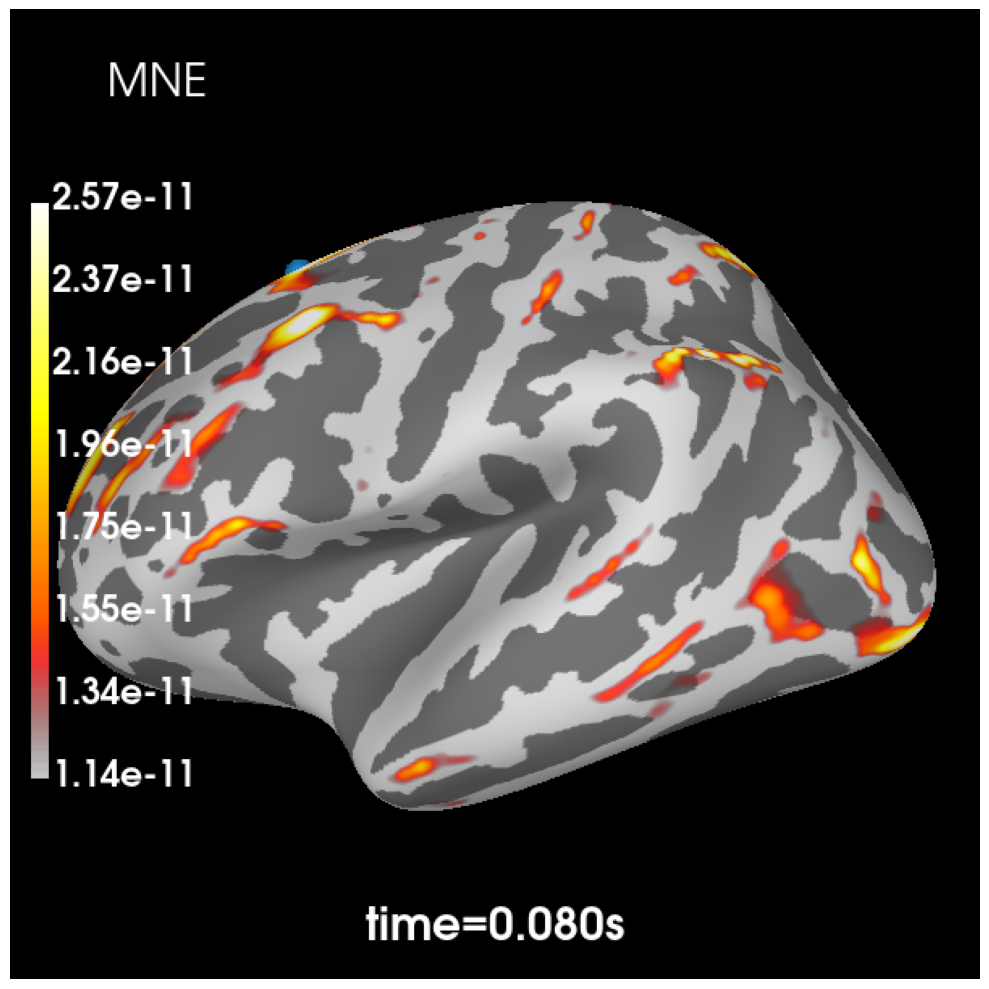

In [61]:
left_hand.set_eeg_reference(projection=True)
snr = 3.0
lambda2 = 1.0 / snr**2
kwargs = dict(
    initial_time=0.08,
    hemi="lh",
    subjects_dir=subjects_dir,
    size=(600, 600),
    clim=dict(kind="percent", lims=[90, 95, 99]),
    smoothing_steps=10,
)

stc = abs(mne.minimum_norm.apply_inverse(left_hand, inv, lambda2, "MNE", verbose=True))
brain = stc.plot(**kwargs)
brain.add_text(0.1, 0.9, "MNE", "title", font_size=14)
show_PyVista(brain)

In [62]:
fname_aseg = subjects_dir / subject / "mri" / "aparc+aseg.mgz"
label_names = mne.get_volume_labels_from_aseg(fname_aseg)
# label_tc = stc.extract_label_time_course(fname_aseg, src=src)
# labels = [
#     label_names[idx]
#     for idx in np.argsort(label_tc.max(axis=1))[:7]
#     if "unknown" not in label_names[idx].lower()
# ]  # remove catch-all
brain = mne.viz.Brain(
    subject,
    hemi="both",
    surf="pial",
    alpha=0.5,
    cortex="low_contrast",
    subjects_dir=subjects_dir,
)
brain.add_volume_labels(aseg="aparc+aseg", labels=label_names)

    Smoothing by a factor of 0.9


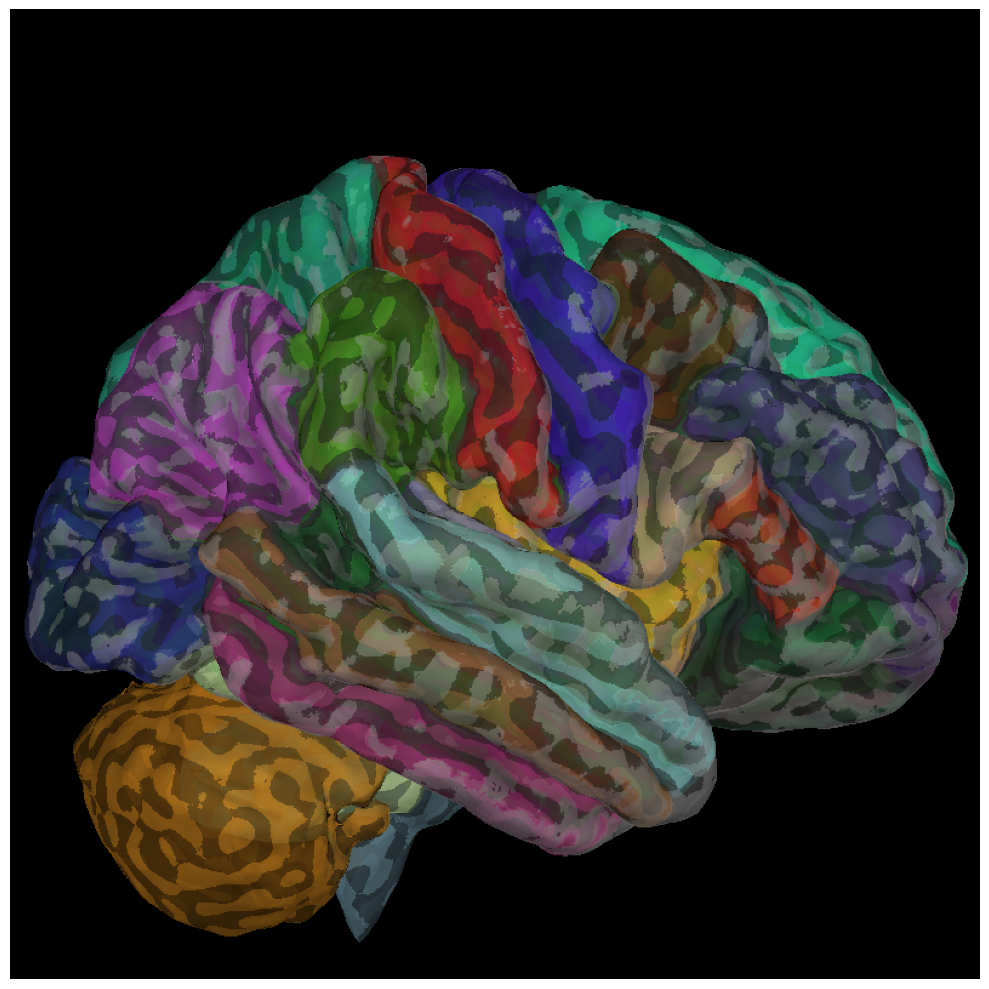

In [63]:
show_PyVista(brain)

## 从源空间中计算连通性

In [64]:
snr = 2.0
lambda2 = 1.0 / snr**2
method = "MNE"  # could also be dSPM or sLORETA)
epochs.set_eeg_reference(projection=True)
stcs = mne.minimum_norm.apply_inverse_epochs(
    epochs['2'], inv, lambda2, method, pick_ori="normal", return_generator=True
)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.


In [65]:
labels = mne.read_labels_from_annot(subject, parc="aparc", subjects_dir=subjects_dir)
label_colors = [label.color for label in labels]
labels

Reading labels from parcellation...
   read 35 labels from /root/mne_data/MNE-fsaverage-data/fsaverage/label/lh.aparc.annot
   read 34 labels from /root/mne_data/MNE-fsaverage-data/fsaverage/label/rh.aparc.annot


[<Label | fsaverage, 'bankssts-lh', lh : 2137 vertices>,
 <Label | fsaverage, 'bankssts-rh', rh : 2196 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-lh', lh : 1439 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-rh', rh : 1608 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-lh', lh : 3736 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-rh', rh : 3494 vertices>,
 <Label | fsaverage, 'cuneus-lh', lh : 1630 vertices>,
 <Label | fsaverage, 'cuneus-rh', rh : 1638 vertices>,
 <Label | fsaverage, 'entorhinal-lh', lh : 1102 vertices>,
 <Label | fsaverage, 'entorhinal-rh', rh : 902 vertices>,
 <Label | fsaverage, 'frontalpole-lh', lh : 272 vertices>,
 <Label | fsaverage, 'frontalpole-rh', rh : 369 vertices>,
 <Label | fsaverage, 'fusiform-lh', lh : 4714 vertices>,
 <Label | fsaverage, 'fusiform-rh', rh : 4661 vertices>,
 <Label | fsaverage, 'inferiorparietal-lh', lh : 7871 vertices>,
 <Label | fsaverage, 'inferiorparietal-rh', rh : 9676 vertices>,
 <Label | fsavera

In [66]:
labels=labels[:-1]
labels

[<Label | fsaverage, 'bankssts-lh', lh : 2137 vertices>,
 <Label | fsaverage, 'bankssts-rh', rh : 2196 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-lh', lh : 1439 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-rh', rh : 1608 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-lh', lh : 3736 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-rh', rh : 3494 vertices>,
 <Label | fsaverage, 'cuneus-lh', lh : 1630 vertices>,
 <Label | fsaverage, 'cuneus-rh', rh : 1638 vertices>,
 <Label | fsaverage, 'entorhinal-lh', lh : 1102 vertices>,
 <Label | fsaverage, 'entorhinal-rh', rh : 902 vertices>,
 <Label | fsaverage, 'frontalpole-lh', lh : 272 vertices>,
 <Label | fsaverage, 'frontalpole-rh', rh : 369 vertices>,
 <Label | fsaverage, 'fusiform-lh', lh : 4714 vertices>,
 <Label | fsaverage, 'fusiform-rh', rh : 4661 vertices>,
 <Label | fsaverage, 'inferiorparietal-lh', lh : 7871 vertices>,
 <Label | fsaverage, 'inferiorparietal-rh', rh : 9676 vertices>,
 <Label | fsavera

In [67]:
labels_names = [label.name for label in labels]
labels_names

['bankssts-lh',
 'bankssts-rh',
 'caudalanteriorcingulate-lh',
 'caudalanteriorcingulate-rh',
 'caudalmiddlefrontal-lh',
 'caudalmiddlefrontal-rh',
 'cuneus-lh',
 'cuneus-rh',
 'entorhinal-lh',
 'entorhinal-rh',
 'frontalpole-lh',
 'frontalpole-rh',
 'fusiform-lh',
 'fusiform-rh',
 'inferiorparietal-lh',
 'inferiorparietal-rh',
 'inferiortemporal-lh',
 'inferiortemporal-rh',
 'insula-lh',
 'insula-rh',
 'isthmuscingulate-lh',
 'isthmuscingulate-rh',
 'lateraloccipital-lh',
 'lateraloccipital-rh',
 'lateralorbitofrontal-lh',
 'lateralorbitofrontal-rh',
 'lingual-lh',
 'lingual-rh',
 'medialorbitofrontal-lh',
 'medialorbitofrontal-rh',
 'middletemporal-lh',
 'middletemporal-rh',
 'paracentral-lh',
 'paracentral-rh',
 'parahippocampal-lh',
 'parahippocampal-rh',
 'parsopercularis-lh',
 'parsopercularis-rh',
 'parsorbitalis-lh',
 'parsorbitalis-rh',
 'parstriangularis-lh',
 'parstriangularis-rh',
 'pericalcarine-lh',
 'pericalcarine-rh',
 'postcentral-lh',
 'postcentral-rh',
 'posteriorcin

In [68]:
src = inv["src"]
label_ts = mne.extract_label_time_course(
    stcs, labels, src, mode="mean_flip", return_generator=True
)

In [69]:
from mne_connectivity import spectral_connectivity_epochs

fmin = 30
fmax = 100.0
sfreq = raw.info["sfreq"]
con_methods = ["plv"]
con = spectral_connectivity_epochs(
    label_ts,
    method=con_methods,
    mode="fourier",
    sfreq=sfreq,
    fmin=fmin,
    fmax=fmax,
    faverage=True,
    # mt_adaptive=True,
    n_jobs=-1,
)

Connectivity computation...
Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 1
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 114 (0 small eigenvalues omitted)
Picked 114 channels from the data
Computing inverse...
    Eigenleads need to be weighted ...
Processing epoch : 1 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 2 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 3 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 4 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 5 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 6 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 7 / 80
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    5.5s finished


Processing epoch : 65 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 66 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 67 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 68 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 69 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 70 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 71 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 72 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 73 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 74 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 75 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 76 / 80
Extracting time courses for 68 labels (mode: mean_flip)
Proc

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


    assembling connectivity matrix
[Connectivity computation done]


[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed:    0.9s finished


In [70]:
con_res = con.get_data(output="dense")[:, :, 0]
con_res.shape

(68, 68)

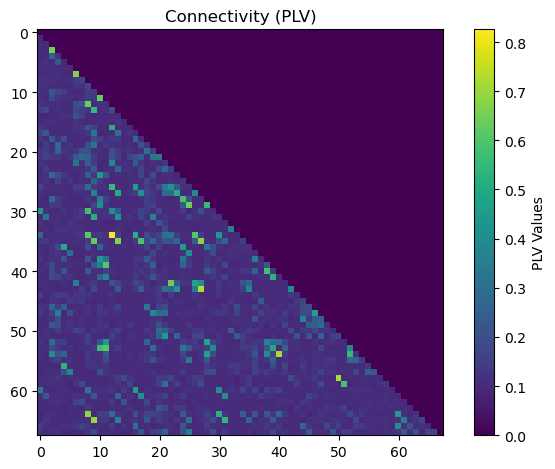

In [71]:
fig, ax = plt.subplots()
im = ax.imshow(con_res, cmap='viridis')
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('PLV Values')

ax.set_title("Connectivity (PLV)")
fig.tight_layout()
plt.show()

In [72]:
type(con_res)
np.savetxt('/zjhszu2023/con.csv', con_res, delimiter=',', fmt='%f')

## 绘制功能连接性图

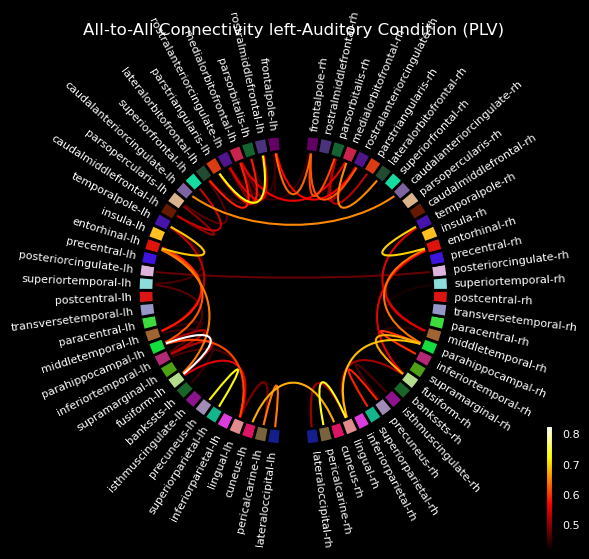

In [73]:
from mne.viz import circular_layout
from mne_connectivity.viz import plot_connectivity_circle


# 重排label
label_names = [label.name for label in labels]

lh_labels = [name for name in label_names if name.endswith("lh")]

# 获取label坐标
label_ypos = list()
for name in lh_labels:
    idx = label_names.index(name)
    ypos = np.mean(labels[idx].pos[:, 1])
    label_ypos.append(ypos)

# 根据坐标重排label
lh_labels = [label for (yp, label) in sorted(zip(label_ypos, lh_labels))]

rh_labels = [label[:-2] + "rh" for label in lh_labels]

node_order = list()
node_order.extend(lh_labels[::-1])
node_order.extend(rh_labels)

node_angles = circular_layout(
    label_names, node_order, start_pos=90, group_boundaries=[0, len(label_names) / 2]
)

fig, ax = plt.subplots(figsize=(8, 8), facecolor="black", subplot_kw=dict(polar=True))
plot_connectivity_circle(
    con_res,
    label_names,
    n_lines=60,
    node_angles=node_angles,
    node_colors=label_colors,
    title="All-to-All Connectivity left-Auditory " "Condition (PLV)",
    ax=ax,
)
fig.tight_layout()